<a href="https://colab.research.google.com/github/M4700F/CSE-4622-ML-Lab-Term-Project/blob/Maroof/resNet_with_adv_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dataset Loading

The dataset contains skin cancer images of the Internal Skin Imaging Collaboration(`ISIC`) archive. The dataset was last updated on `20-06-2019`. It has a balanced number of images of benign and malignant skin moles.

The dataset has a total of 3297 images, each with `.jpg` extension and `224x224` dimension.

The dataset is loaded to a drive folder.



In [ ]:
from google.colab import drive

drive.mount('/content/drive')

dataset_path = '/content/drive/MyDrive/data'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


The name of the dataset folder is `data`. It has two folders `train` and `test`. Each of this folder has two folders `benign` and `malignant`.

Let's assign these folder's path to variables.

In [ ]:
import os

train_path = os.path.join(dataset_path, 'train')
test_path = os.path.join(dataset_path, 'test')

train_benign_path = os.path.join(train_path, 'benign')
train_malignant_path = os.path.join(train_path, 'malignant')

test_benign_path = os.path.join(test_path, 'benign')
test_malignant_path = os.path.join(test_path, 'malignant')

Lets check the dataset structure if it has truly the folders.

In [ ]:
print(f"Dataset folder exists: {os.path.exists(dataset_path)}")
print(f"Train folder exists: {os.path.exists(train_path)}")
print(f"Test folder exists: {os.path.exists(test_path)}")

print("\nTrain folders:")
print(f"    Train/benign exists: {os.path.exists(train_benign_path)}")
print(f"    Train/malignant exists: {os.path.exists(train_malignant_path)}")

print("\nTest folders:")
print(f"    Test/benign exists: {os.path.exists(test_benign_path)}")
print(f"    Test/malignant exists: {os.path.exists(test_malignant_path)}")

Dataset folder exists: True
Train folder exists: True
Test folder exists: True

Train folders:
    Train/benign exists: True
    Train/malignant exists: True

Test folders:
    Test/benign exists: True
    Test/malignant exists: True


Let's check the img count.

In [ ]:
train_benign_count = len([f for f in os.listdir(train_benign_path) if f.endswith('.jpg')])
print(f"Train/Benign images: {train_benign_count}")

train_malignant_count = len([f for f in os.listdir(train_malignant_path) if f.endswith('.jpg')])
print(f"Train/Malignant images: {train_malignant_count}")

test_benign_count = len([f for f in os.listdir(test_benign_path) if f.endswith('.jpg')])
print(f"Test/Benign images: {test_benign_count}")

test_malignant_count = len([f for f in os.listdir(test_malignant_path) if f.endswith('.jpg')])
print(f"Test/Malignant images: {test_malignant_count}")

Train/Benign images: 1440
Train/Malignant images: 1197
Test/Benign images: 360
Test/Malignant images: 300


**Function to load images**

For our experiment, we choose 500 images randomly from the `benign` and `malignant` folders of the `train` folders. We don't touch the `test` folders because they are used for testing purposes. They have to be unseened.

So 500 images from `benign` and 500 images from `malignant`. Total `1000` images. This is called `stratified sampling`, where fixed number of data are collected from each `strata` or groups, here benign and malignant.

This is very important because this ensures that the class distribution is balanced.

Also the images are resized to 224x224 dimension.

In [ ]:
import random
import numpy as np

from tensorflow.keras.preprocessing.image import load_img, img_to_array

IMG_SIZE = 224 #224x224
NUM_SAMPLES = 500

In [ ]:
def load_images(folder_path, label, max_samples):
  images = []
  labels = []

  # Get all jpg files
  files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]

  # Randomly select max_samples files
  if len(files) > max_samples:
    files = random.sample(files, max_samples)

  print(f"Loading {len(files)} images from {folder_path.split('/')[-1]} folder...")

  for i, filename in enumerate(files):
    try:
      # Load and resize image
      img_path = os.path.join(folder_path, filename)
      img = load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
      img_array = img_to_array(img)
      # img_array = img_array / 255.0

      images.append(img_array)
      labels.append(label)

      if (i + 1) % 100 == 0:
        print(f"  Processed {i + 1}/{len(files)} images")

    except Exception as e:
      print(f"  Error loading {filename}: {e}")
      continue

  return np.array(images), np.array(labels)


Loading from `train` folder

In [ ]:
train_benign_images, train_benign_labels = load_images(train_benign_path, 0, NUM_SAMPLES) # 0 for benign
train_malignant_images, train_malignant_labels = load_images(train_malignant_path, 1, NUM_SAMPLES) # 1 for malignant

Loading 500 images from benign folder...
  Processed 100/500 images
  Processed 200/500 images
  Processed 300/500 images
  Processed 400/500 images
  Processed 500/500 images
Loading 500 images from malignant folder...
  Processed 100/500 images
  Processed 200/500 images
  Processed 300/500 images
  Processed 400/500 images
  Processed 500/500 images


`axis=0` means stacking the arrays on top of each other increasing the rows/number of samples.

In [ ]:
import numpy as np

# Combining training data
X_train = np.concatenate([train_benign_images, train_malignant_images], axis=0)
y_train = np.concatenate([train_benign_labels, train_malignant_labels], axis=0)

Loading from `test` folder

In [ ]:
test_benign_images, test_benign_labels = load_images(test_benign_path, 0, NUM_SAMPLES) # 0 for benign
test_malignant_images, test_malignant_labels = load_images(test_malignant_path, 1, NUM_SAMPLES) # 1 for malignant

Loading 360 images from benign folder...
  Processed 100/360 images
  Processed 200/360 images
  Processed 300/360 images
Loading 300 images from malignant folder...
  Processed 100/300 images
  Processed 200/300 images
  Processed 300/300 images


In [ ]:
# Combine test data
X_test = np.concatenate([test_benign_images, test_malignant_images], axis=0)
y_test = np.concatenate([test_benign_labels, test_malignant_labels], axis=0)

Dataset Summary

In [ ]:
print(f"Training set:")
print(f"  Total images: {len(X_train)}")
print(f"  Benign images: {np.sum(y_train == 0)}")
print(f"  Malignant images: {np.sum(y_train == 1)}")

Training set:
  Total images: 1000
  Benign images: 500
  Malignant images: 500


In [ ]:
print(f"Test set:")
print(f"  Total images: {len(X_test)}")
print(f"  Benign images: {np.sum(y_test == 0)}")
print(f"  Malignant images: {np.sum(y_test == 1)}")

Test set:
  Total images: 660
  Benign images: 360
  Malignant images: 300


Image specification

In [ ]:
print(f"Image shape: {X_train[0].shape}")
print(f"Pixel value range: [{X_train.min():.3f}, {X_train.max():.3f}]")

Image shape: (224, 224, 3)
Pixel value range: [0.000, 255.000]


Function for display images

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
def display_sample_images(X, y, title="Sample images", num_samples=6):
  fig, axes = plt.subplots(2,3, figsize=(12, 8))
  axes = axes.ravel()

  for i in range(num_samples):
    idx = random.randint(0, len(X) - 1)
    img = X[idx]
    label = 'Malignant' if y[idx] == 1 else 'Benign'
    img_display = img / 255.0

    axes[i].imshow(img_display)
    axes[i].set_title(f'{label}')
    axes[i].axis('off')

  plt.suptitle(title, fontsize=16)
  plt.tight_layout()
  plt.show()

Let's display the images.

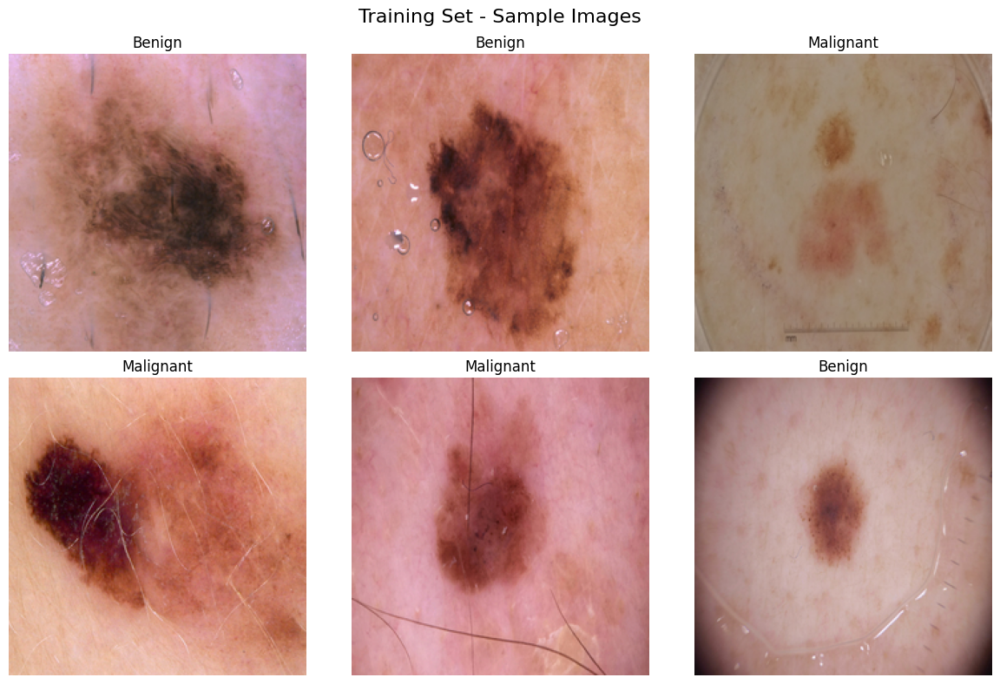

In [ ]:
display_sample_images(X_train, y_train, "Training Set - Sample Images")

# Dataset Preparation



1.   One-hot encoding the data
2.   Data augmentation



Importing the necessary libraries

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator

**One-hot Encoding**

One-hot encoding is a process where categorical variables are converted into binary vectors.

Imagine there are 3 classes cat, dog, rabbit each has label 0, 1, 2 accordingly.

One-hot encoding convert the three class into binary vectors.

Cat    → [1, 0, 0]

Dog    → [0, 1, 0]

Rabbit → [0, 0, 1]

This helps machine learing algorithm to make better predicitons.

Here we converts our strings labels using `LabelEncoder` from sklearn's library.

LabelEncoder identifies all unique labels using `fit()` and then sort them lexicographically (alphabetically) then assigns integers starting from 0 using `transform()`.

Our labels are already in 0 and 1. But if the labels were like 'benign', 'malignant' then 0 would be assigned to 'benign' and 1 would be assigned to 'malignant' because b comes before m.

And to one-hot encoding we use `to_categorical`


In [ ]:
label_encoder = LabelEncoder()

y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Convert to one-hot encoding (categorical)
y_train_onehot = to_categorical(y_train_encoded, num_classes=2)
y_test_onehot = to_categorical(y_test_encoded, num_classes=2)

print(f"Original labels shape: {y_train.shape}")
print(f"One-hot encoded labels shape: {y_train_onehot.shape}")

Original labels shape: (1000,)
One-hot encoded labels shape: (1000, 2)


In [ ]:
# show some examples
print(f"Example - Original: {y_train[:5]} -> One-hot: {y_train_onehot[:5]}")

Example - Original: [0 0 0 0 0] -> One-hot: [[1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]]


Now let's split the training data into 70/30. We use `stratified` sampling here also to maintain class balancing.

In [ ]:
X_train_final, X_val, y_train_final, y_val = train_test_split(
    X_train, y_train_onehot,
    test_size=0.3,
    random_state=42,
    stratify=y_train_encoded
)

In [ ]:
print(f"Final training set: {len(X_train_final)} images")
print(f"Validation set: {len(X_val)} images")
print(f"Test set: {len(X_test)} images")

Final training set: 700 images
Validation set: 300 images
Test set: 660 images


Let's see the class distribution in training set and validation set.

Here np.argmax(y_train_final, axis=1) converts the one-hot encoding to normal labels [0, 1, 0]

In [ ]:
print(f"Class distribution in final training set:")
print(f"  Benign: {np.sum(np.argmax(y_train_final, axis=1) == 0)}")
print(f"  Malignant: {np.sum(np.argmax(y_train_final, axis=1) == 1)}")

Class distribution in final training set:
  Benign: 350
  Malignant: 350


In [ ]:
print(f"Class distribution in validation set:")
print(f"  Benign: {np.sum(np.argmax(y_val, axis=1) == 0)}")
print(f"  Malignant: {np.sum(np.argmax(y_val, axis=1) == 1)}")

Class distribution in validation set:
  Benign: 150
  Malignant: 150


# Data Augmentation

We use data augmentation to change the present images. We set the rotation range of the image 15. Images that have been rotated, scaled, cropped and flipped has led to many models to misclassifing images. By using augmented data, it can train the CNN model to better classify the images.

In [ ]:
from tensorflow.keras.applications.resnet50 import preprocess_input

In [ ]:
# Create data generators
# Training data generator with augmentation

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=15,         # Rotate images by up to 15 degrees
    width_shift_range=0.1,     # Shift images horizontally
    height_shift_range=0.1,    # Shift images vertically
    horizontal_flip=True,      # Flip images horizontally
    zoom_range=0.1,            # Zoom in/out
    shear_range=0.1,           # Shear transformation
    fill_mode='nearest'       # Fill missing pixels
    #rescale=1.0                # Images are already normalized
)

No augmentation in Validation and test data generators

In [ ]:
#val_datagen = ImageDataGenerator(rescale=1.0)
#test_datagen = ImageDataGenerator(rescale=1.0)

# Validation data generator (no augmentation, but WITH preprocessing)
val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input  # ← ALSO CRUCIAL FOR VALIDATION!
)

# Test data generator (no augmentation, but WITH preprocessing)
test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input  # ← AND FOR TESTING!
)

In [ ]:
BATCH_SIZE = 32

In [ ]:
# Training generator (with augmentation)
train_generator = train_datagen.flow(
    X_train_final, y_train_final,
    batch_size=BATCH_SIZE,
    shuffle=True
)

# Validation generator (no augmentation)
val_generator = val_datagen.flow(
    X_val, y_val,
    batch_size=BATCH_SIZE,
    shuffle=False
)

# Test generator (no augmentation)
test_generator = test_datagen.flow(
    X_test, y_test_onehot,
    batch_size=BATCH_SIZE,
    shuffle=False
)

In [ ]:
print(f"   Data generators created with batch size: {BATCH_SIZE}")
print(f"   Training batches per epoch: {len(train_generator)}")
print(f"   Validation batches per epoch: {len(val_generator)}")
print(f"   Test batches: {len(test_generator)}")

   Data generators created with batch size: 32
   Training batches per epoch: 22
   Validation batches per epoch: 10
   Test batches: 21


   Displaying sample augmented images...


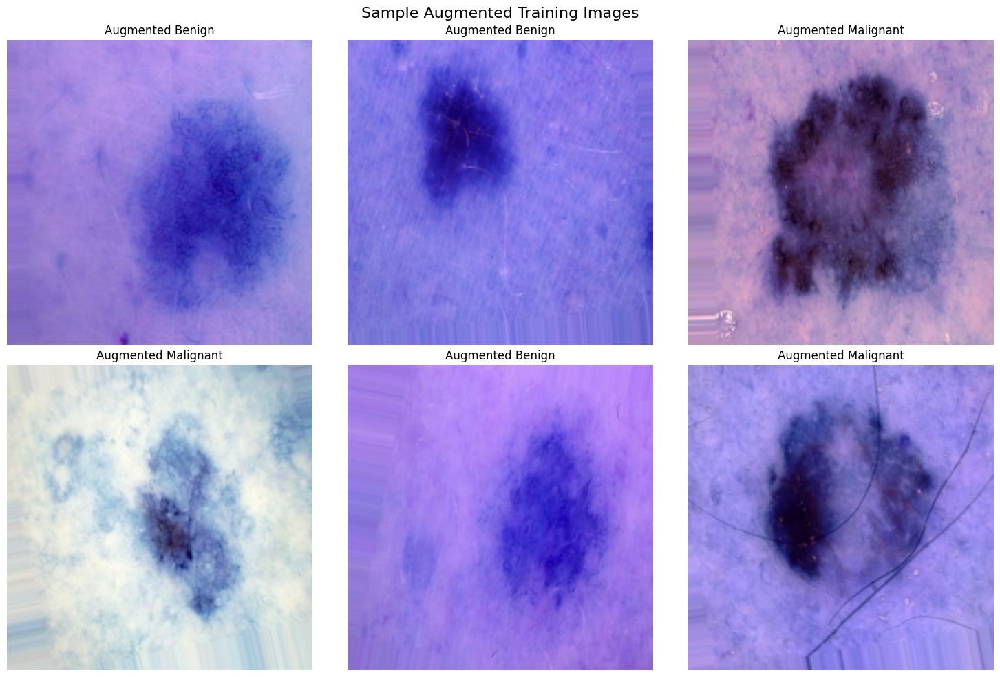

In [ ]:
def show_augmented_images(generator, num_images=6):
    """Display original and augmented images"""
    # Get a batch from the generator
    batch_images, batch_labels = next(generator)

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()

    for i in range(min(num_images, len(batch_images))):
        img = batch_images[i]
        label = np.argmax(batch_labels[i])
        label_name = 'Malignant' if label == 1 else 'Benign'
        img_display = (img - img.min()) / (img.max() - img.min())

        axes[i].imshow(img_display)
        axes[i].set_title(f'Augmented {label_name}')
        axes[i].axis('off')

    plt.suptitle('Sample Augmented Training Images', fontsize=16)
    plt.tight_layout()
    plt.show()

print("   Displaying sample augmented images...")
show_augmented_images(train_generator)

Dataset is prepared for training.


1.   Labels converted to one-hot encoding
2.   Data split using straified sampling
3.   Data augmentation applied to training set
4.   Data generators created for training, validation and testing



# Transfer Learning using ResNet-50

In [ ]:
# Loading necessary libraries

import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications import EfficientNetB1
from tensorflow.keras.layers import Dense, Dropout, Flatten, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

Let's load the pre-trained ResNet-50 base model without the top fully-connected layers.

Because this ResNet-50 is pretrained on `ImageNet` data which has 1000 classes. But we need only two classes. So we exclude the outer layer of the model. And build our own customized output layer.

We then freeze the model's layer. This is a clever techique. The ResNet-50 already trained on ImageNet dataset which is a huge dataset. This model now inherits a great potential of solving any classification problem. The inner model's parameter are fully optimized. They gradient descented to the minimum. They achieve a kind of super power. Isn't that amazing.

We will now utilize those parameters. We do not touch them. We will change the output layer for our preferences. The output will be simple so it will take less computation power.

In [ ]:
base_model = ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
)

print(f"ResNet-50 base model loaded successfully")
print(f"Base model input shape: {base_model.input_shape}")
print(f"Base model output shape: {base_model.output_shape}")

ResNet-50 base model loaded successfully
Base model input shape: (None, 224, 224, 3)
Base model output shape: (None, 7, 7, 2048)


In [ ]:
# Let's freeze the model's layers
base_model.trainable = False

print(f"Base model layers frozen: {not base_model.trainable}")
print(f"Total layers in base model")

Base model layers frozen: True
Total layers in base model


Let's build the complete model with custom top layers

In [ ]:
inputs = base_model.input

x = base_model(inputs, training=False) # Set training=False to freeze batch norm

# Global Average Pooling instead of Flatten (more efficient and reduces overfitting)
x = GlobalAveragePooling2D()(x)
# x = Flatten()(x)

# Add dropout for regularization (keeping consistent with the paper)
x = Dropout(0.25)(x)

# Add dense layers (keeping consistent with the paper)
# Dense layer with 128 neurons and ReLU activation
x = Dense(128, activation='relu', name='dense_128')(x)
x = Dropout(0.25)(x) # Dropout after firest dense layer

x = Dense(64, activation='relu', name='dense_64')(x)
# No dropout before final layer

# Output layer with 2 neurons and softmax activation
outputs = Dense(2, activation='softmax', name='predictions')(x)

# Create the complete model
model = Model(inputs, outputs)

print("Model Architecture created successfully")

Model Architecture created successfully


Let's see the model summary

In [ ]:
print("\nModel Summary:")
print(f"Total parameters: {model.count_params():,}")
print(f"Trainable parameters: {sum(np.prod(p.shape) for p in model.trainable_variables):,}")


Model Summary:
Total parameters: 23,858,370
Trainable parameters: 270,658


Let's compile the model

In [ ]:
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("ResNet-50 model compiled successfully")

ResNet-50 model compiled successfully


Model Architecture overview

In [ ]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,858,370 (91.01 MB)

 Trainable params: 270,658 (1.03 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
# Step 7: Visualize model architecture (optional)
try:
    tf.keras.utils.plot_model(
        model,
        to_file='resnet50_model.png',
        show_shapes=True,
        show_layer_names=True,
        dpi=150
    )
    print("\n✓ Model architecture diagram saved as 'resnet50_model.png'")
except:
    print("\n! Could not save model diagram (graphviz not installed)")


✓ Model architecture diagram saved as 'resnet50_model.png'


Setting up callbacks for training

In [ ]:
# Early stopping to prevent overfitting
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

# Reduce learning rate on plateau
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-7,
    verbose=1
)

callbacks = [early_stopping, reduce_lr]

In [ ]:
import time

Setting up training parameters

In [ ]:
LEARNING_RATE = 0.0001  # Learning rate set to 0.0001 as mentioned in paper
EPOCHS = 15            # Number of iterations set to 15 as mentioned in paper
BATCH_SIZE = 32         # Batch size set to 32 as mentioned in paper

print(f"Training parameters:")
print(f"- Learning rate: {LEARNING_RATE}")
print(f"- Epochs: {EPOCHS}")
print(f"- Batch size: {BATCH_SIZE}")
print(f"- Optimizer: Adam")
print(f"- Loss function: Categorical crossentropy")
print(f"- Metric: Accuracy")

Training parameters:
- Learning rate: 0.0001
- Epochs: 15
- Batch size: 32
- Optimizer: Adam
- Loss function: Categorical crossentropy
- Metric: Accuracy


In [ ]:
# Step 3: Display training setup
steps_per_epoch = len(train_generator)
validation_steps = len(val_generator)

print(f"\nTraining setup:")
print(f"- Training samples: {len(X_train_final)}")
print(f"- Validation samples: {len(X_val)}")
print(f"- Steps per epoch: {steps_per_epoch}")
print(f"- Validation steps: {validation_steps}")


Training setup:
- Training samples: 700
- Validation samples: 300
- Steps per epoch: 22
- Validation steps: 10


Let's start training. Yahoo!

In [ ]:
# Record training start time
start_time = time.time()

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=EPOCHS,
    validation_data=val_generator,
    validation_steps=validation_steps,
    callbacks=callbacks,
    verbose=1
)

# Record training end time
end_time = time.time()
training_time = end_time - start_time

print(f"\n✓ Training completed!")
print(f"Total training time: {training_time/60:.2f} minutes")

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.5234 - loss: 0.8698 - val_accuracy: 0.7267 - val_loss: 0.5882 - learning_rate: 1.0000e-04
Epoch 2/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 16s 377ms/step - accuracy: 0.6626 - loss: 0.5942 - val_accuracy: 0.7100 - val_loss: 0.5425 - learning_rate: 1.0000e-04
Epoch 3/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 11s 400ms/step - accuracy: 0.7467 - loss: 0.5689 - val_accuracy: 0.7200 - val_loss: 0.5151 - learning_rate: 1.0000e-04
Epoch 4/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 444ms/step - accuracy: 0.7595 - loss: 0.4686 - val_accuracy: 0.7433 - val_loss: 0.4773 - learning_rate: 1.0000e-04
Epoch 5/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 10s 417ms/step - accuracy: 0.8004 - loss: 0.4499 - val_accuracy: 0.7467 - val_loss: 0.4585 - learning_rate: 1.0000e-04
Epoch 6/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 9s 378ms/step - accuracy: 0.7968 - loss: 0.4539 - val_accuracy: 0.7733 - val_loss: 0.4418 - learning_rate: 1.0000e-04
Epoch 7/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 11s 402ms/step - accurac

Let's display the training results

In [ ]:
final_train_acc = history.history['accuracy'][-1]
final_val_acc = history.history['val_accuracy'][-1]
final_train_loss = history.history['loss'][-1]
final_val_loss = history.history['val_loss'][-1]

print(f"Final Training Accuracy: {final_train_acc:.4f} ({final_train_acc*100:.2f}%)")
print(f"Final Validation Accuracy: {final_val_acc:.4f} ({final_val_acc*100:.2f}%)")
print(f"Final Training Loss: {final_train_loss:.4f}")
print(f"Final Validation Loss: {final_val_loss:.4f}")

Final Training Accuracy: 0.8686 (86.86%)
Final Validation Accuracy: 0.8133 (81.33%)
Final Training Loss: 0.3103
Final Validation Loss: 0.3727


Plotting the training accuracy, val_accuracy vs epoch

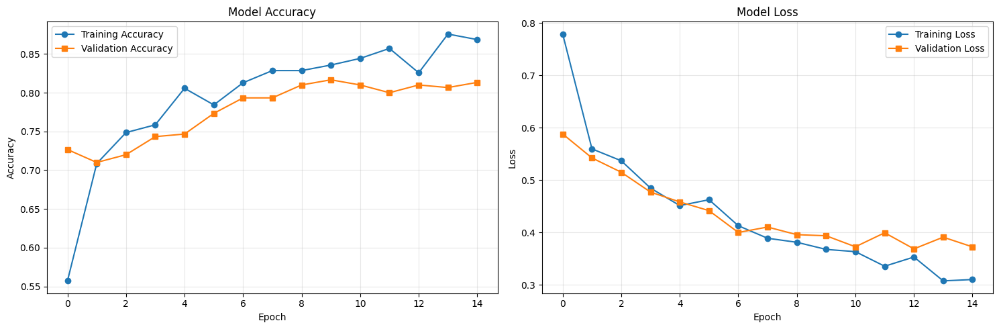

In [ ]:
def plot_training_history(history):
    """Plot training and validation accuracy and loss"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # Plot accuracy
    ax1.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='s')
    ax1.set_title('Model Accuracy')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Accuracy')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Plot loss
    ax2.plot(history.history['loss'], label='Training Loss', marker='o')
    ax2.plot(history.history['val_loss'], label='Validation Loss', marker='s')
    ax2.set_title('Model Loss')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Loss')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

plot_training_history(history)


Let's evalutate based on test set

In [ ]:
test_loss, test_accuracy = model.evaluate(test_generator, verbose=1)

print(f"\n Test Results")
print(f"Test Accuracy: {test_accuracy:.4f} ({test_accuracy*100:.2f}%)")
print(f"Test Loss: {test_loss:.4f}")

21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 262ms/step - accuracy: 0.8286 - loss: 0.3428

 Test Results
Test Accuracy: 0.8470 (84.70%)
Test Loss: 0.3336


In [ ]:
# Display detailed training metrics
print(f"\n7. Detailed Training Metrics:")
print("="*50)
print(f"{'Epoch':<6} {'Train Acc':<10} {'Val Acc':<10} {'Train Loss':<12} {'Val Loss':<10}")
print("-"*50)

for i in range(len(history.history['accuracy'])):
    epoch = i + 1
    train_acc = history.history['accuracy'][i]
    val_acc = history.history['val_accuracy'][i]
    train_loss = history.history['loss'][i]
    val_loss = history.history['val_loss'][i]

    print(f"{epoch:<6} {train_acc:<10.4f} {val_acc:<10.4f} {train_loss:<12.4f} {val_loss:<10.4f}")


7. Detailed Training Metrics:
Epoch  Train Acc  Val Acc    Train Loss   Val Loss  
--------------------------------------------------
1      0.5571     0.7267     0.7790       0.5882    
2      0.7086     0.7100     0.5597       0.5425    
3      0.7486     0.7200     0.5371       0.5151    
4      0.7586     0.7433     0.4849       0.4773    
5      0.8057     0.7467     0.4515       0.4585    
6      0.7843     0.7733     0.4627       0.4418    
7      0.8129     0.7933     0.4130       0.4002    
8      0.8286     0.7933     0.3891       0.4105    
9      0.8286     0.8100     0.3814       0.3960    
10     0.8357     0.8167     0.3678       0.3939    
11     0.8443     0.8100     0.3636       0.3729    
12     0.8571     0.8000     0.3357       0.3996    
13     0.8257     0.8100     0.3533       0.3688    
14     0.8757     0.8067     0.3077       0.3912    
15     0.8686     0.8133     0.3103       0.3727    


Let's save the model.

In [ ]:
print(f"\n Saving the trained model")

model.save('resnet50_skin_cancer_model.keras')
print("✓ Model saved as 'resnet50_skin_cancer_model.keras'")


 Saving the trained model
✓ Model saved as 'resnet50_skin_cancer_model.keras'


Let's display the training summary

In [ ]:
# Training summary
print(f"\n Training Summary:")
print("="*50)
print(f"✓ Model trained successfully for {EPOCHS} epochs")
print(f"✓ Training time: {training_time/60:.2f} minutes")
print(f"✓ Best validation accuracy: {max(history.history['val_accuracy']):.4f}")
print(f"✓ Final test accuracy: {test_accuracy:.4f} ({test_accuracy*100:.2f}%)")

if test_accuracy >= 0.85:  # Check if close to paper's 88% accuracy
    print(f"✓ Model achieved good performance (≥85% accuracy)")
    print("✓ Model is ready for adversarial attack testing!")
else:
    print(f"! Model accuracy is below 85%. Consider:")
    print("  - Training for more epochs")
    print("  - Adjusting learning rate")
    print("  - Fine-tuning hyperparameters")

print(f"\nVariables created:")
print("- history: Training history with metrics")
print("- model: Trained ResNet-50 model")
print(f"- test_accuracy: Final test accuracy ({test_accuracy:.4f})")

print(f"\nNext step: Implement FGSM adversarial attack!")
print("="*60)


 Training Summary:
✓ Model trained successfully for 15 epochs
✓ Training time: 3.07 minutes
✓ Best validation accuracy: 0.8167
✓ Final test accuracy: 0.8470 (84.70%)
! Model accuracy is below 85%. Consider:
  - Training for more epochs
  - Adjusting learning rate
  - Fine-tuning hyperparameters

Variables created:
- history: Training history with metrics
- model: Trained ResNet-50 model
- test_accuracy: Final test accuracy (0.8470)

Next step: Implement FGSM adversarial attack!


# Results

Detailed results with accuracy, recall, precision, F1-score.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score
import pandas as pd

In [ ]:
# Make predictions on test set
print("1. Making predictions on test set...")

# Get predictions from the model
test_predictions = model.predict(test_generator, verbose=1)
test_pred_classes = np.argmax(test_predictions, axis=1)

# Get true labels
test_true_classes = np.argmax(y_test_onehot, axis=1)

print(f"✓ Predictions completed")
print(f"Test samples: {len(test_pred_classes)}")

1. Making predictions on test set...
21/21 ━━━━━━━━━━━━━━━━━━━━ 10s 270ms/step
✓ Predictions completed
Test samples: 660


In [ ]:
# Define class names
class_names = ['Benign', 'Malignant']

# Generate classification report
report = classification_report(
    test_true_classes,
    test_pred_classes,
    target_names=class_names,
    output_dict=True
)

# Create formatted classification report table
print(f"Classification Results of the Trained Model")
print("="*70)
print(f"{'Class':<12} {'Precision':<12} {'Recall':<12} {'F1-Score':<12} {'Support':<12}")
print("-"*70)

for class_name in class_names:
    precision = report[class_name]['precision'] * 100
    recall = report[class_name]['recall'] * 100
    f1 = report[class_name]['f1-score'] * 100
    support = int(report[class_name]['support'])

    print(f"{class_name:<12} {precision:<12.0f}% {recall:<12.0f}% {f1:<12.0f}% {support:<12}")

# Overall accuracy
overall_accuracy = report['accuracy'] * 100
print("-"*70)
print(f"{'Overall':<12} {'Accuracy:':<12} {overall_accuracy:<12.0f}%")

Classification Results of the Trained Model
Class        Precision    Recall       F1-Score     Support     
----------------------------------------------------------------------
Benign       89          % 82          % 85          % 360         
Malignant    80          % 88          % 84          % 300         
----------------------------------------------------------------------
Overall      Accuracy:    85          %


In [ ]:
# Display detailed metrics as mentioned in paper
print(f"   Detailed Performance Analysis:")
print("="*50)

precision_benign = report['Benign']['precision'] * 100
precision_malignant = report['Malignant']['precision'] * 100
recall_benign = report['Benign']['recall'] * 100
recall_malignant = report['Malignant']['recall'] * 100
f1_benign = report['Benign']['f1-score'] * 100
f1_malignant = report['Malignant']['f1-score'] * 100

print(f"PRECISION (Model's accuracy of positive predictions):")
print(f"- Benign images correctly predicted: {precision_benign:.0f}%")
print(f"- Malignant images correctly predicted: {precision_malignant:.0f}%")

print(f"\nRECALL (Ability to find all positive instances):")
print(f"- Benign recall: {recall_benign:.0f}%")
print(f"- Malignant recall: {recall_malignant:.0f}%")

print(f"\nF1-SCORE (Percentage of positive predictions that were correct):")
print(f"- Benign F1-score: {f1_benign:.0f}%")
print(f"- Malignant F1-score: {f1_malignant:.0f}%")

print(f"\nSUPPORT (Number of actual occurrences):")
print(f"- Benign images: {int(report['Benign']['support'])}")
print(f"- Malignant images: {int(report['Malignant']['support'])}")

   Detailed Performance Analysis:
PRECISION (Model's accuracy of positive predictions):
- Benign images correctly predicted: 89%
- Malignant images correctly predicted: 80%

RECALL (Ability to find all positive instances):
- Benign recall: 82%
- Malignant recall: 88%

F1-SCORE (Percentage of positive predictions that were correct):
- Benign F1-score: 85%
- Malignant F1-score: 84%

SUPPORT (Number of actual occurrences):
- Benign images: 360
- Malignant images: 300


   Creating Confusion Matrix (Figure 3)...


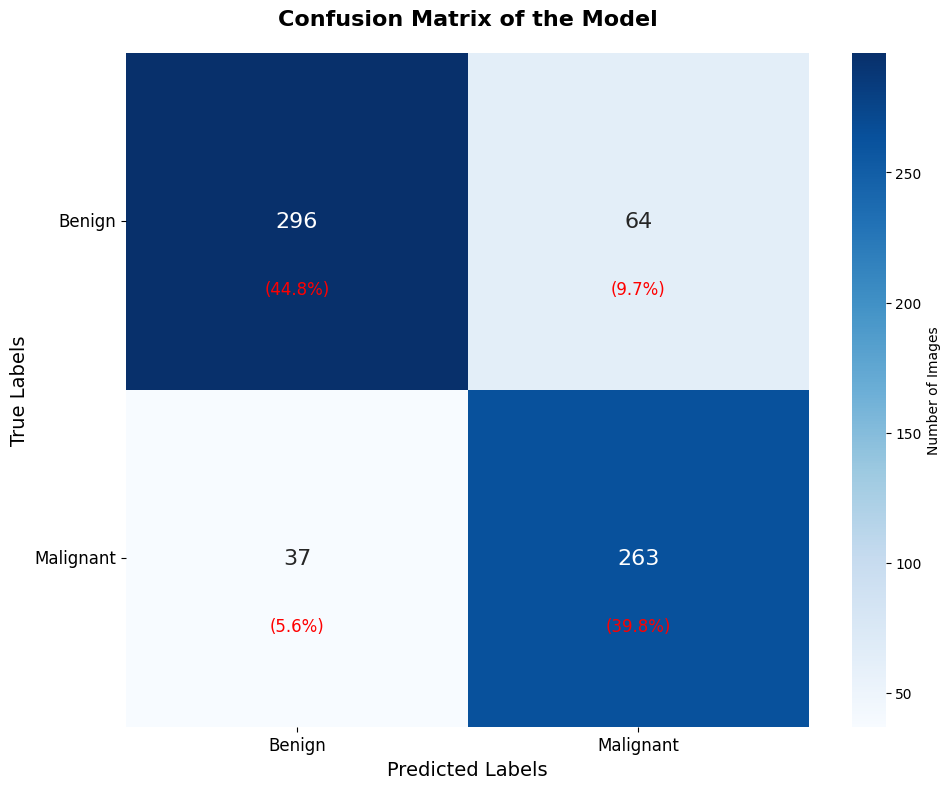

In [ ]:
# Create Confusion Matrix (Figure 3)
print(f"   Creating Confusion Matrix (Figure 3)...")

def plot_confusion_matrix():
    """Create Figure 3: Confusion matrix"""
    # Calculate confusion matrix
    cm = confusion_matrix(test_true_classes, test_pred_classes)

    # Create confusion matrix plot
    plt.figure(figsize=(10, 8))

    # Use seaborn for better visualization
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names,
                annot_kws={'size': 16}, cbar_kws={'label': 'Number of Images'})

    plt.title('Confusion Matrix of the Model', fontsize=16, fontweight='bold', pad=20)
    plt.xlabel('Predicted Labels', fontsize=14)
    plt.ylabel('True Labels', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12, rotation=0)

    # Add percentage annotations
    total = cm.sum()
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            percentage = (cm[i, j] / total) * 100
            plt.text(j+0.5, i+0.7, f'({percentage:.1f}%)',
                    ha='center', va='center', fontsize=12, color='red')

    plt.tight_layout()
    plt.show()

    return cm

cm = plot_confusion_matrix()

In [ ]:
# Calculate and display confusion matrix metrics
print(f"Confusion Matrix Analysis:")
print("="*50)

# Extract values from confusion matrix
tn, fp, fn, tp = cm.ravel()

# Calculate rates as mentioned in paper
benign_true_positive_rate = (cm[0,0] / (cm[0,0] + cm[0,1])) * 100
benign_false_positive_rate = (cm[0,1] / (cm[0,0] + cm[0,1])) * 100

malignant_true_negative_rate = (cm[1,1] / (cm[1,0] + cm[1,1])) * 100
malignant_false_negative_rate = (cm[1,0] / (cm[1,0] + cm[1,1])) * 100

print(f"BENIGN Classification:")
print(f"- True Positive Rate: {benign_true_positive_rate:.0f}% ({cm[0,0]} images)")
print(f"- False Positive Rate: {benign_false_positive_rate:.0f}% ({cm[0,1]} images)")

print(f"\nMALIGNANT Classification:")
print(f"- True Negative Rate: {malignant_true_negative_rate:.0f}% ({cm[1,1]} images)")
print(f"- False Negative Rate: {malignant_false_negative_rate:.0f}% ({cm[1,0]} images)")

Confusion Matrix Analysis:
BENIGN Classification:
- True Positive Rate: 82% (296 images)
- False Positive Rate: 18% (64 images)

MALIGNANT Classification:
- True Negative Rate: 88% (263 images)
- False Negative Rate: 12% (37 images)


In [ ]:
# Summary of Results
print(f"RESULTS SUMMARY:")
print("="*60)
print(f"✓ Overall Model Accuracy: {overall_accuracy:.0f}%")
print(f"✓ High classification accuracy achieved")
print(f"✓ Model demonstrates strong performance on both classes")
print(f"✓ Training and validation curves show good learning progression")
print(f"✓ Minimal overfitting observed")

# Create summary table
summary_data = {
    'Metric': ['Precision', 'Recall', 'F1-Score', 'Support'],
    'Benign': [f"{precision_benign:.0f}%", f"{recall_benign:.0f}%",
               f"{f1_benign:.0f}%", f"{int(report['Benign']['support'])}"],
    'Malignant': [f"{precision_malignant:.0f}%", f"{recall_malignant:.0f}%",
                  f"{f1_malignant:.0f}%", f"{int(report['Malignant']['support'])}"]
}

summary_df = pd.DataFrame(summary_data)
print(f"\nSUMMARY TABLE:")
print(summary_df.to_string(index=False))

print(f"\n✓ Model is ready for adversarial attack testing!")
print(f"✓ Current accuracy ({overall_accuracy:.0f}%) will be compared against")
print(f"  post-attack accuracy to demonstrate FGSM impact")

print(f"\nVariables created:")
print("- test_pred_classes: Model predictions on test set")
print("- test_true_classes: True labels for test set")
print("- report: Classification report dictionary")
print("- cm: Confusion matrix")
print("="*60)

RESULTS SUMMARY:
✓ Overall Model Accuracy: 85%
✓ High classification accuracy achieved
✓ Model demonstrates strong performance on both classes
✓ Training and validation curves show good learning progression
✓ Minimal overfitting observed

SUMMARY TABLE:
   Metric Benign Malignant
Precision    89%       80%
   Recall    82%       88%
 F1-Score    85%       84%
  Support    360       300

✓ Model is ready for adversarial attack testing!
✓ Current accuracy (85%) will be compared against
  post-attack accuracy to demonstrate FGSM impact

Variables created:
- test_pred_classes: Model predictions on test set
- test_true_classes: True labels for test set
- report: Classification report dictionary
- cm: Confusion matrix


# Implementing FGSM Attack to the trained ResNet CNN

**Generating Image Adversary**

To implement the attack, we used our model to make predictions on the input image and then compute the loss. From there, we calculate the gradient of loss w.r.t input image and compute the sign of the gradient. Then, we construct the image adversary by adding the image with the sign of the gradient.

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

**Function of creating adversarial pattern of the image using FGSM.**

Basically here we calculate the sign of the gradient.

In [ ]:
# def create_adversarial_pattern(input_image, input_label, model):
#   """
#     Create adversarial pattern using FGSM attack
#   """
#   # Convert input to tensor
#   input_image = tf.cast(input_image, tf.float32)

#   with tf.GradientTape() as tape:
#     tape.watch(input_image)
#     # preprocessed_image = preprocess_input(tf.cast(input_image, tf.float32))
#     # Make prediction
#     prediction = model(preprocess_input)
#     # Calculate loss
#     loss = tf.keras.losses.categorical_crossentropy(input_label, prediction)

#   # Get the gradient of the loss w.r.t to the input image
#   gradient = tape.gradient(loss, input_image)

#   # Get the sign of the gradient to create the perturbation
#   signed_grad = tf.sign(gradient)

#   return signed_grad

**Function to create adversarial example image**

In [ ]:
def generate_adversarial_examples(model, X_test, y_test_onehot, epsilon=0.01):
  """
    Generate adversarial examples using FGSM attack

    Args:
        model: Trained CNN model
        X_test: Test images
        y_test_onehot: Test labels (one-hot encoded)
        epsilon: Perturbation magnitude

    Returns:
        adversarial_images: Generated adversarial examples
  """
  print(f"Generating adversarial examples with epsilon = {epsilon}...")

  adversarial_images = []

  for i in range(len(X_test)):
      # Get single image and label
      raw_image = X_test[i:i+1]          # Keep batch dimension
      label = y_test_onehot[i:i+1]

      raw_tensor = tf.convert_to_tensor(raw_image)

      with tf.GradientTape() as tape:
        tape.watch(raw_tensor)
        preprocessed_tensor = preprocess_input(raw_tensor)
        prediction = model(preprocessed_tensor)
        loss = tf.keras.losses.categorical_crossentropy(label, prediction)

      gradient = tape.gradient(loss, raw_tensor)
      signed_gradient = tf.sign(gradient)

      # Get the gradient of the loss w.r.t the input

      # # Preprocess for the model
      # preprocessed_image = preprocess_input(raw_image.copy())

      # # Create adversarial pattern
      # perturbations = create_adversarial_pattern(preprocessed_image, label, model)

      # CRITICAL: Apply perturbation to RAW image, not preprocessed
      # Create adversarial image
      adversarial_image = raw_tensor + epsilon * signed_gradient

      # Clip to valid pixel range [0, 255]
      adversarial_image = tf.clip_by_value(adversarial_image, 0, 255)

      adversarial_images.append(adversarial_image.numpy())

      if (i + 1) % 100 == 0:
        print(f"Generated {i + 1}/{len(X_test)} adversarial examples")

  return np.vstack(adversarial_images)

Function to evaluate the adversarial attack

In [ ]:
def evaluate_adversarial_attack(model, X_original, X_adversarial, y_true, class_names):
  """
    Evaluate the impact of adversarial attack

    Args:
        model: Trained CNN model
        X_original: Original test images
        X_adversarial: Adversarial test images
        y_true: True labels (one-hot encoded)
        class_names: List of class names
  """
  print("\n" + "="*50)
  print("EVALUATING ADVERSARIAL ATTACK IMPACT")
  print("="*50)

  # Preprocess both sets for model prediction
  X_original_processed = preprocess_input(X_original.copy())
  X_adversarial_processed = preprocess_input(X_adversarial.copy())

  # Get predictions for original images
  print("Making predictions on original images...")
  original_predictions = model.predict(X_original_processed, verbose=0)
  original_pred_classes = np.argmax(original_predictions, axis=1)

  # Get predictions for adversarial images
  print("Making predictions on adversarial images...")
  adversarial_predictions = model.predict(X_adversarial_processed, verbose=0)
  adversarial_pred_classes = np.argmax(adversarial_predictions, axis=1)

  # Get true classes
  true_classes = np.argmax(y_true, axis=1)

  # Calculate accuracies
  original_accuracy = np.mean(original_pred_classes == true_classes)
  adversarial_accuracy = np.mean(adversarial_pred_classes == true_classes)

  print(f"\nOriginal Model Accuracy: {original_accuracy:.2%}")
  print(f"Adversarial Model Accuracy: {adversarial_accuracy:.2%}")
  print(f"Accuracy Drop: {original_accuracy - adversarial_accuracy:.2%}")

  return original_pred_classes, adversarial_pred_classes, true_classes


Function for plotting confusion matrices

In [ ]:
def plot_confusion_matrices(original_pred, adversarial_pred, true_labels, class_names):
    """
    Plot confusion matrices for original and adversarial predictions
    """
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # Original predictions confusion matrix
    cm_original = confusion_matrix(true_labels, original_pred)
    sns.heatmap(cm_original, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=axes[0])
    axes[0].set_title('Confusion Matrix - Original Images')
    axes[0].set_xlabel('Predicted')
    axes[0].set_ylabel('Actual')

    # Adversarial predictions confusion matrix
    cm_adversarial = confusion_matrix(true_labels, adversarial_pred)
    sns.heatmap(cm_adversarial, annot=True, fmt='d', cmap='Reds',
                xticklabels=class_names, yticklabels=class_names, ax=axes[1])
    axes[1].set_title('Confusion Matrix - Adversarial Images')
    axes[1].set_xlabel('Predicted')
    axes[1].set_ylabel('Actual')

    plt.tight_layout()
    plt.show()

    return cm_original, cm_adversarial

Function to visualize adversarial example where the attack succeeded.

In [ ]:
def visualize_adversarial_examples(X_original, X_adversarial, y_true,
                                 original_pred, adversarial_pred, class_names, n_samples=6):
    """
    Visualize original vs adversarial images with predictions
    """
    # Find examples where adversarial attack succeeded (changed prediction)
    attack_success = (original_pred != adversarial_pred)
    success_indices = np.where(attack_success)[0]

    if len(success_indices) < n_samples:
        indices = success_indices
    else:
        indices = np.random.choice(success_indices, n_samples, replace=False)

    fig, axes = plt.subplots(2, n_samples, figsize=(15, 6))

    for i, idx in enumerate(indices):
        # Original image
        org_disp = X_original[idx] / 255.0
        axes[0, i].imshow(org_disp)
        axes[0, i].set_title(f'Original\nTrue: {class_names[np.argmax(y_true[idx])]}\n'
                           f'Pred: {class_names[original_pred[idx]]}')
        axes[0, i].axis('off')

        # Adversarial image
        adv_disp = X_adversarial[idx] / 255.0
        axes[1, i].imshow(adv_disp)
        axes[1, i].set_title(f'Adversarial\nTrue: {class_names[np.argmax(y_true[idx])]}\n'
                           f'Pred: {class_names[adversarial_pred[idx]]}')
        axes[1, i].axis('off')

    plt.suptitle('Original vs Adversarial Images Comparison', fontsize=16)
    plt.tight_layout()
    plt.show()

Function to run fgsm attack

In [ ]:
# Main execution code
def run_fgsm_attack(model, X_test, y_test_onehot, class_names=['Benign', 'Malignant'], epsilon=0.01):
    """
    Main function to run FGSM attack

    Args:
        model: Your trained ResNet-50 model
        X_test: Test images (normalized to [0,1])
        y_test_onehot: Test labels (one-hot encoded)
        class_names: List of class names
        epsilon: Perturbation strength
    """
    print("Starting FGSM Attack Implementation...")
    print(f"Test set size: {len(X_test)}")
    print(f"Epsilon (perturbation strength): {epsilon}")

    # Step 1: Generate adversarial examples
    X_adversarial = generate_adversarial_examples(model, X_test, y_test_onehot, epsilon)

    # Step 2: Evaluate attack impact
    original_pred, adversarial_pred, true_labels = evaluate_adversarial_attack(
        model, X_test, X_adversarial, y_test_onehot, class_names
    )

    # Step 3: Plot confusion matrices
    print("\nGenerating confusion matrices...")
    cm_original, cm_adversarial = plot_confusion_matrices(
        original_pred, adversarial_pred, true_labels, class_names
    )

    # Step 4: Visualize some adversarial examples
    print("\nVisualizing adversarial examples...")
    visualize_adversarial_examples(
        X_test, X_adversarial, y_test_onehot, original_pred, adversarial_pred, class_names
    )

    # Step 5: Print detailed classification report
    print("\nClassification Report - Original Images:")
    print(classification_report(true_labels, original_pred, target_names=class_names))

    print("\nClassification Report - Adversarial Images:")
    print(classification_report(true_labels, adversarial_pred, target_names=class_names))

    return X_adversarial, original_pred, adversarial_pred

**Implementing FGSM attack**


PART 2: IMPLEMENTING FGSM ATTACK
Test data shape: (660, 224, 224, 3)
Test data range: [0.000, 255.000]
Test labels shape: (660, 2)

Testing with Epsilon = 0.5
Starting FGSM Attack Implementation...
Test set size: 660
Epsilon (perturbation strength): 0.5
Generating adversarial examples with epsilon = 0.5...
Generated 100/660 adversarial examples
Generated 200/660 adversarial examples
Generated 300/660 adversarial examples
Generated 400/660 adversarial examples
Generated 500/660 adversarial examples
Generated 600/660 adversarial examples

EVALUATING ADVERSARIAL ATTACK IMPACT
Making predictions on original images...
Making predictions on adversarial images...

Original Model Accuracy: 84.70%
Adversarial Model Accuracy: 33.48%
Accuracy Drop: 51.21%

Generating confusion matrices...


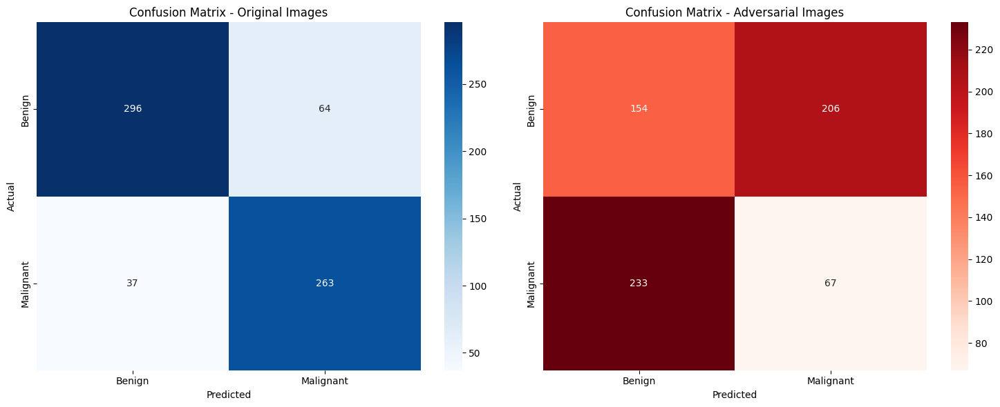


Visualizing adversarial examples...


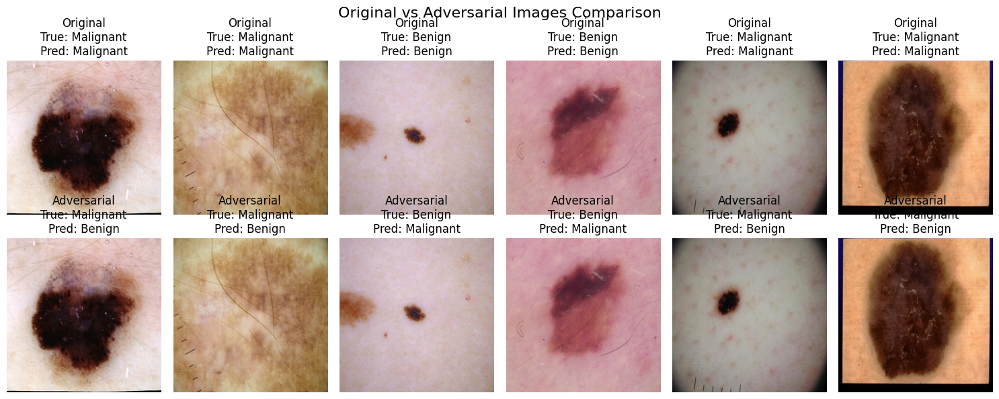


Classification Report - Original Images:
              precision    recall  f1-score   support

      Benign       0.89      0.82      0.85       360
   Malignant       0.80      0.88      0.84       300

    accuracy                           0.85       660
   macro avg       0.85      0.85      0.85       660
weighted avg       0.85      0.85      0.85       660


Classification Report - Adversarial Images:
              precision    recall  f1-score   support

      Benign       0.40      0.43      0.41       360
   Malignant       0.25      0.22      0.23       300

    accuracy                           0.33       660
   macro avg       0.32      0.33      0.32       660
weighted avg       0.33      0.33      0.33       660


SUMMARY for Epsilon = 0.5:
Original Accuracy: 85%
Adversarial Accuracy: 33%
Accuracy Drop: 51%

Testing with Epsilon = 1.0
Starting FGSM Attack Implementation...
Test set size: 660
Epsilon (perturbation strength): 1.0
Generating adversarial examples with eps

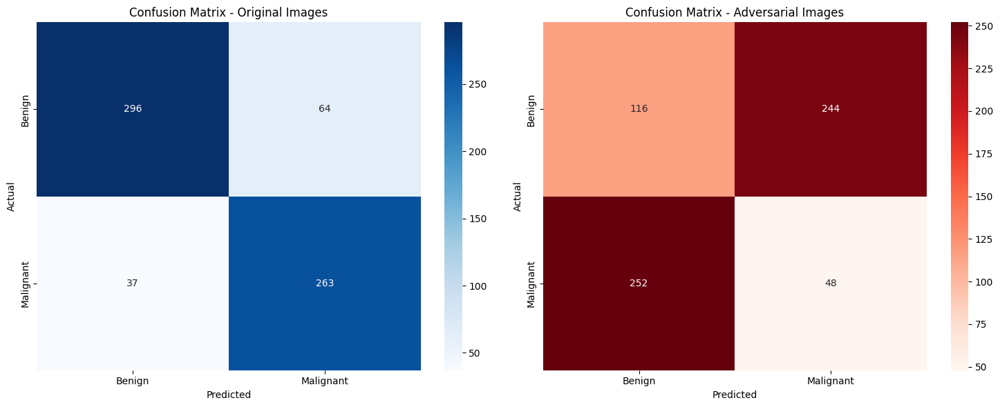


Visualizing adversarial examples...


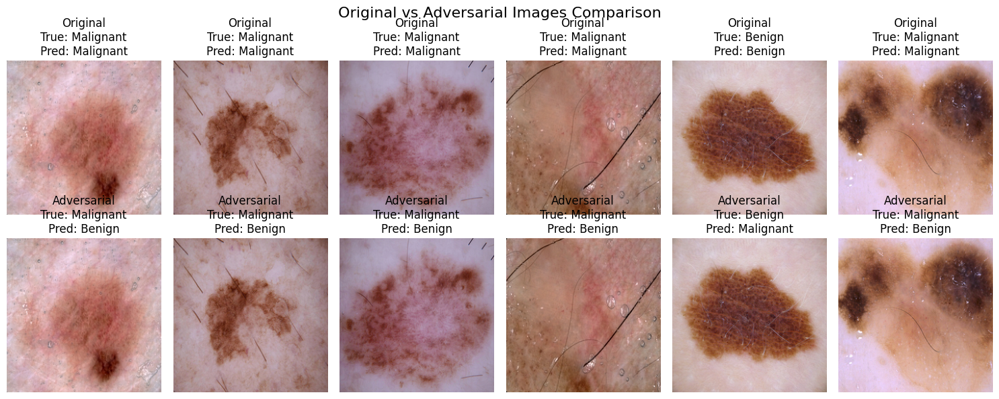


Classification Report - Original Images:
              precision    recall  f1-score   support

      Benign       0.89      0.82      0.85       360
   Malignant       0.80      0.88      0.84       300

    accuracy                           0.85       660
   macro avg       0.85      0.85      0.85       660
weighted avg       0.85      0.85      0.85       660


Classification Report - Adversarial Images:
              precision    recall  f1-score   support

      Benign       0.32      0.32      0.32       360
   Malignant       0.16      0.16      0.16       300

    accuracy                           0.25       660
   macro avg       0.24      0.24      0.24       660
weighted avg       0.25      0.25      0.25       660


SUMMARY for Epsilon = 1.0:
Original Accuracy: 85%
Adversarial Accuracy: 25%
Accuracy Drop: 60%

Testing with Epsilon = 2.55
Starting FGSM Attack Implementation...
Test set size: 660
Epsilon (perturbation strength): 2.55
Generating adversarial examples with e

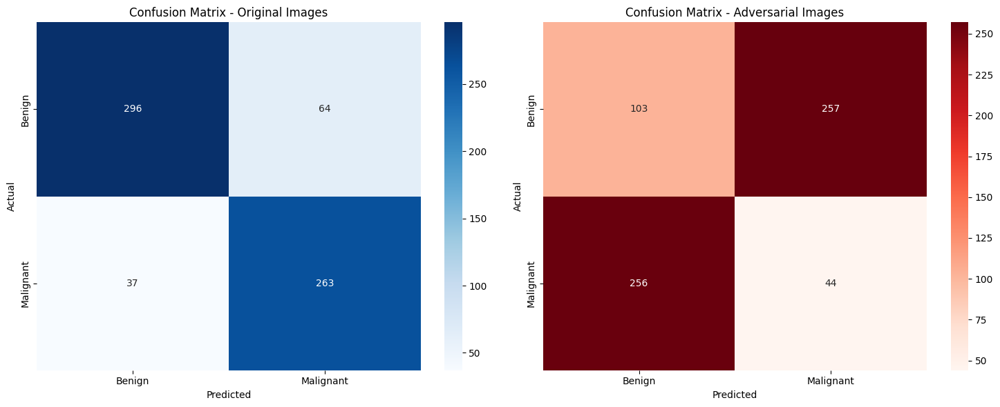


Visualizing adversarial examples...


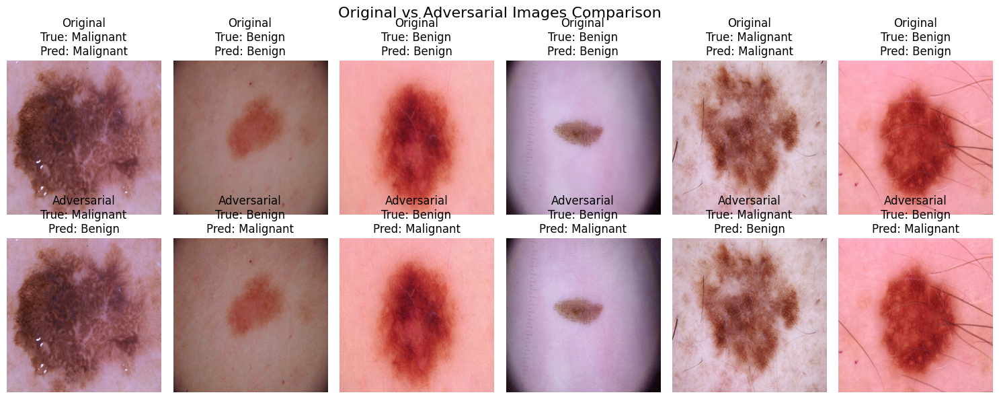


Classification Report - Original Images:
              precision    recall  f1-score   support

      Benign       0.89      0.82      0.85       360
   Malignant       0.80      0.88      0.84       300

    accuracy                           0.85       660
   macro avg       0.85      0.85      0.85       660
weighted avg       0.85      0.85      0.85       660


Classification Report - Adversarial Images:
              precision    recall  f1-score   support

      Benign       0.29      0.29      0.29       360
   Malignant       0.15      0.15      0.15       300

    accuracy                           0.22       660
   macro avg       0.22      0.22      0.22       660
weighted avg       0.22      0.22      0.22       660


SUMMARY for Epsilon = 2.55:
Original Accuracy: 85%
Adversarial Accuracy: 22%
Accuracy Drop: 62%

Testing with Epsilon = 3.815
Starting FGSM Attack Implementation...
Test set size: 660
Epsilon (perturbation strength): 3.815
Generating adversarial examples wit

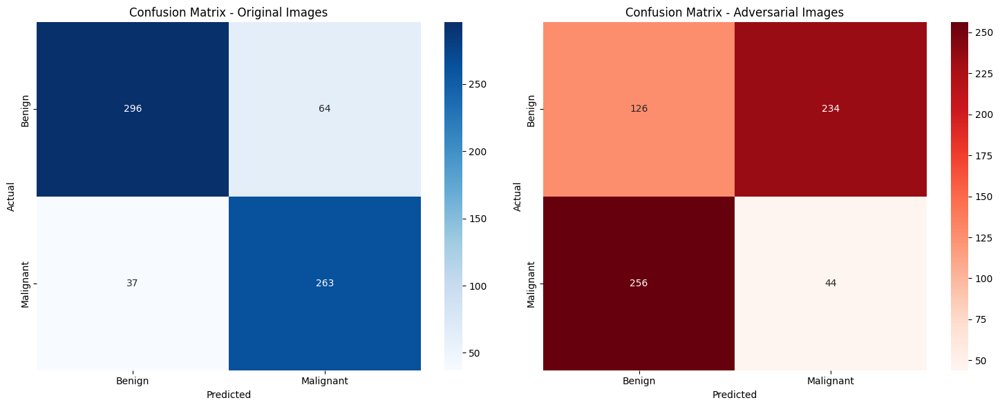


Visualizing adversarial examples...


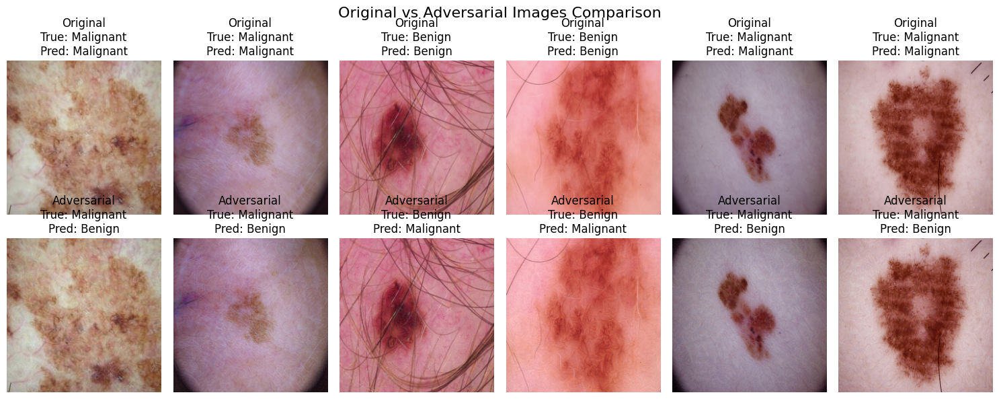


Classification Report - Original Images:
              precision    recall  f1-score   support

      Benign       0.89      0.82      0.85       360
   Malignant       0.80      0.88      0.84       300

    accuracy                           0.85       660
   macro avg       0.85      0.85      0.85       660
weighted avg       0.85      0.85      0.85       660


Classification Report - Adversarial Images:
              precision    recall  f1-score   support

      Benign       0.33      0.35      0.34       360
   Malignant       0.16      0.15      0.15       300

    accuracy                           0.26       660
   macro avg       0.24      0.25      0.25       660
weighted avg       0.25      0.26      0.25       660


SUMMARY for Epsilon = 3.815:
Original Accuracy: 85%
Adversarial Accuracy: 26%
Accuracy Drop: 59%


In [ ]:
print("\n" + "="*60)
print("PART 2: IMPLEMENTING FGSM ATTACK")
print("="*60)

# Make sure your test data is in the right format
# If your images are in [0,255] range, normalize them to [0,1]
# if X_test.max() > 1.0:
#     X_test_normalized = X_test / 255.0
# else:
#     X_test_normalized = X_test

# print(f"Test data shape: {X_test_normalized.shape}")
# print(f"Test data range: [{X_test_normalized.min():.3f}, {X_test_normalized.max():.3f}]")
# print(f"Test labels shape: {y_test_onehot.shape}")

print(f"Test data shape: {X_test.shape}")
print(f"Test data range: [{X_test.min():.3f}, {X_test.max():.3f}]")
print(f"Test labels shape: {y_test_onehot.shape}")

# Run FGSM attack with different epsilon values
# Note: These epsilon values are for raw pixel space (0-255)
epsilon_values = [0.5, 1.0, 2.55, 3.815]  # Different perturbation strengths
results_data = []

for eps in epsilon_values:
    print(f"\n{'='*40}")
    print(f"Testing with Epsilon = {eps}")
    print(f"{'='*40}")

    # Run FGSM attack
    X_adversarial, original_pred, adversarial_pred = run_fgsm_attack(
        model=model,
        X_test=X_test,    # Raw images, no normalizations needed
        y_test_onehot=y_test_onehot,
        class_names=['Benign', 'Malignant'],
        epsilon=eps
    )

    # Calculate metrics similar to the paper
    true_labels = np.argmax(y_test_onehot, axis=1)
    original_accuracy = np.mean(original_pred == true_labels) * 100
    adversarial_accuracy = np.mean(adversarial_pred == true_labels) * 100

    results_data.append({
    'epsilon': eps,
    'original_accuracy': original_accuracy,
    'adversarial_accuracy': adversarial_accuracy,
    'accuracy_drop': original_accuracy - adversarial_accuracy
    })

    print(f"\nSUMMARY for Epsilon = {eps}:")
    print(f"Original Accuracy: {original_accuracy:.0f}%")
    print(f"Adversarial Accuracy: {adversarial_accuracy:.0f}%")
    print(f"Accuracy Drop: {original_accuracy - adversarial_accuracy:.0f}%")

    # Save adversarial examples if needed
    # np.save(f'adversarial_examples_eps_{eps}.npy', X_adversarial)


In [ ]:
# Additional analysis: Attack success rate
def analyze_attack_success(original_pred, adversarial_pred, true_labels, class_names):
    """
    Analyze attack success rate per class
    """
    print("\nATTACK SUCCESS ANALYSIS:")
    print("-" * 30)

    for i, class_name in enumerate(class_names):
        class_mask = (true_labels == i)
        class_original = original_pred[class_mask]
        class_adversarial = adversarial_pred[class_mask]

        # Originally correctly classified
        correctly_classified = (class_original == i)

        # Among correctly classified, how many became misclassified
        if np.sum(correctly_classified) > 0:
            attack_success = np.sum(class_adversarial[correctly_classified] != i)
            success_rate = attack_success / np.sum(correctly_classified) * 100
            print(f"{class_name}: {attack_success}/{np.sum(correctly_classified)} "
                  f"({success_rate:.1f}%) successfully attacked")

# Run attack success analysis for the last epsilon value
analyze_attack_success(original_pred, adversarial_pred, true_labels, ['Benign', 'Malignant'])

print(f"\n{'='*60}")
print("FGSM ATTACK IMPLEMENTATION COMPLETED")
print("="*60)


ATTACK SUCCESS ANALYSIS:
------------------------------
Benign: 170/296 (57.4%) successfully attacked
Malignant: 219/263 (83.3%) successfully attacked

FGSM ATTACK IMPLEMENTATION COMPLETED


**Analysis of FGSM attack**

In [ ]:
# Extract data for plotting
epsilons = [r['epsilon'] for r in results_data]
original_accs = [r['original_accuracy'] for r in results_data]
adversarial_accs = [r['adversarial_accuracy'] for r in results_data]
accuracy_drops = [r['accuracy_drop'] for r in results_data]

In [ ]:
# Create the visualization
import matplotlib.pyplot as plt
import numpy as np

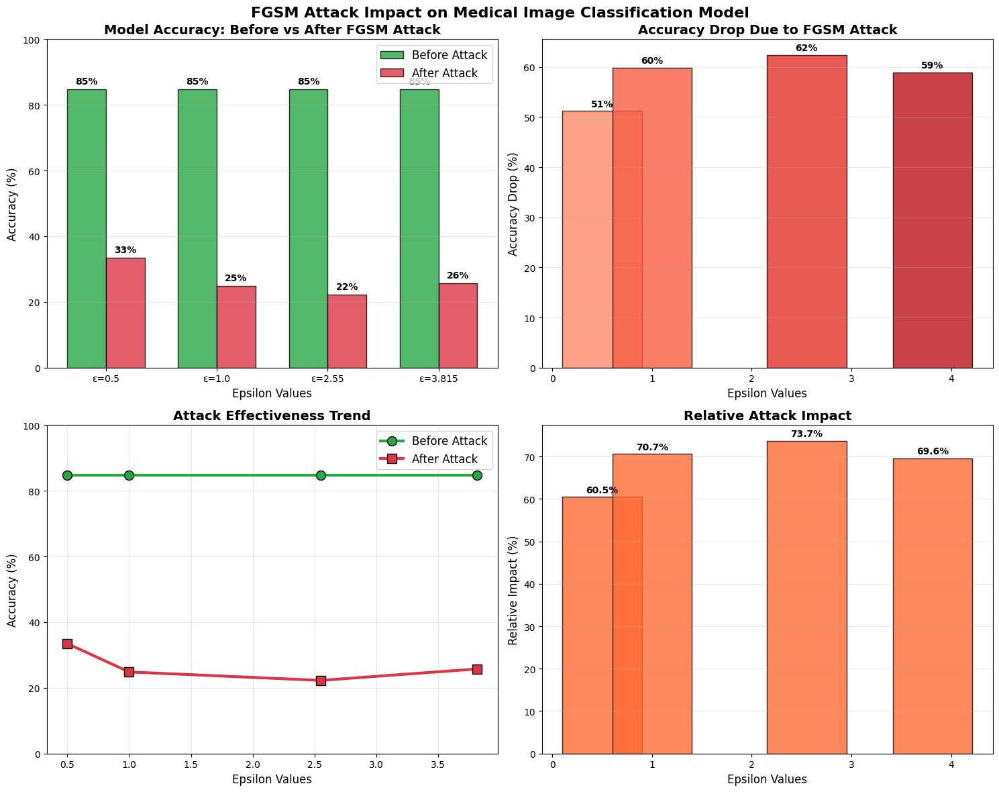

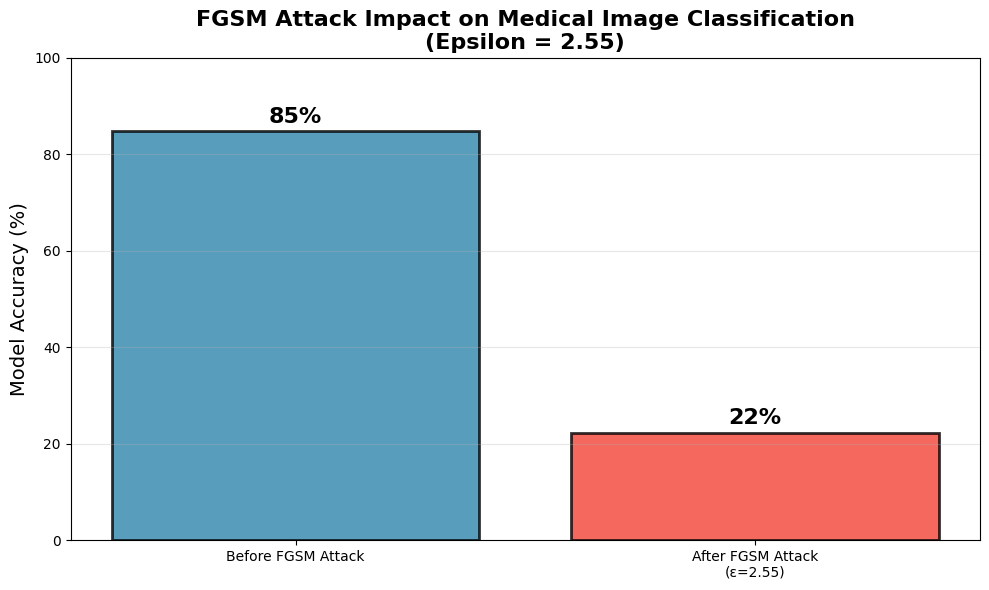


FINAL RESULTS SUMMARY TABLE
Epsilon    Original Acc    Adversarial Acc    Accuracy Drop   Relative Impact
----------------------------------------------------------------------
0.5        84.7           % 33.5              % 51.2           % 60.5           %
1.0        84.7           % 24.8              % 59.8           % 70.7           %
2.55       84.7           % 22.3              % 62.4           % 73.7           %
3.815      84.7           % 25.8              % 58.9           % 69.6           %

📊 KEY FINDINGS:
   • Model is vulnerable to FGSM attacks
   • Worst case: 62% accuracy drop at ε=2.55
   • Model accuracy degraded from 85% to 22%
   • Attack effectiveness increases with epsilon value


In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('FGSM Attack Impact on Medical Image Classification Model', fontsize=16, fontweight='bold')

# Chart 1: Side-by-side comparison
x_pos = np.arange(len(epsilons))
width = 0.35

bars1 = ax1.bar(x_pos - width/2, original_accs, width,
               label='Before Attack', color='#28a745', alpha=0.8, edgecolor='black')
bars2 = ax1.bar(x_pos + width/2, adversarial_accs, width,
               label='After Attack', color='#dc3545', alpha=0.8, edgecolor='black')

ax1.set_xlabel('Epsilon Values', fontsize=12)
ax1.set_ylabel('Accuracy (%)', fontsize=12)
ax1.set_title('Model Accuracy: Before vs After FGSM Attack', fontsize=14, fontweight='bold')
ax1.set_xticks(x_pos)
ax1.set_xticklabels([f'ε={eps}' for eps in epsilons])
ax1.legend(fontsize=12)
ax1.grid(axis='y', alpha=0.3)
ax1.set_ylim(0, 100)

# Add value labels
for bar in bars1:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height + 1,
             f'{height:.0f}%', ha='center', va='bottom', fontweight='bold')

for bar in bars2:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height + 1,
             f'{height:.0f}%', ha='center', va='bottom', fontweight='bold')

# Chart 2: Accuracy drop
colors = plt.cm.Reds(np.linspace(0.4, 0.8, len(epsilons)))
bars3 = ax2.bar(epsilons, accuracy_drops, color=colors, alpha=0.8, edgecolor='black')
ax2.set_xlabel('Epsilon Values', fontsize=12)
ax2.set_ylabel('Accuracy Drop (%)', fontsize=12)
ax2.set_title('Accuracy Drop Due to FGSM Attack', fontsize=14, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

for i, bar in enumerate(bars3):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + 0.5,
             f'{height:.0f}%', ha='center', va='bottom', fontweight='bold')

# Chart 3: Line plot
ax3.plot(epsilons, original_accs, 'o-', color='#28a745',
         linewidth=3, markersize=10, label='Before Attack', markeredgecolor='black')
ax3.plot(epsilons, adversarial_accs, 's-', color='#dc3545',
         linewidth=3, markersize=10, label='After Attack', markeredgecolor='black')
ax3.set_xlabel('Epsilon Values', fontsize=12)
ax3.set_ylabel('Accuracy (%)', fontsize=12)
ax3.set_title('Attack Effectiveness Trend', fontsize=14, fontweight='bold')
ax3.legend(fontsize=12)
ax3.grid(True, alpha=0.3)
ax3.set_ylim(0, 100)

# Chart 4: Attack impact percentage
impact_percentages = [(orig - adv) / orig * 100 for orig, adv in zip(original_accs, adversarial_accs)]
bars4 = ax4.bar(epsilons, impact_percentages, color='#ff6b35', alpha=0.8, edgecolor='black')
ax4.set_xlabel('Epsilon Values', fontsize=12)
ax4.set_ylabel('Relative Impact (%)', fontsize=12)
ax4.set_title('Relative Attack Impact', fontsize=14, fontweight='bold')
ax4.grid(axis='y', alpha=0.3)

for i, bar in enumerate(bars4):
    height = bar.get_height()
    ax4.text(bar.get_x() + bar.get_width()/2., height + 0.5,
             f'{height:.1f}%', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

# Create a simple comparison chart (similar to your reference image)
fig2, ax = plt.subplots(1, 1, figsize=(10, 6))

# Using the most impactful epsilon for comparison (usually the largest one)
max_impact_idx = np.argmax(accuracy_drops)
before_acc = original_accs[max_impact_idx]
after_acc = adversarial_accs[max_impact_idx]
eps_val = epsilons[max_impact_idx]

categories = ['Before FGSM Attack', f'After FGSM Attack\n(ε={eps_val})']
accuracies = [before_acc, after_acc]
colors = ['#2E86AB', '#F24236']

bars = ax.bar(categories, accuracies, color=colors, alpha=0.8, edgecolor='black', linewidth=2)
ax.set_ylabel('Model Accuracy (%)', fontsize=14)
ax.set_title(f'FGSM Attack Impact on Medical Image Classification\n(Epsilon = {eps_val})',
             fontsize=16, fontweight='bold')
ax.set_ylim(0, 100)
ax.grid(axis='y', alpha=0.3)

# Add percentage labels on bars
for i, bar in enumerate(bars):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height + 1,
             f'{height:.0f}%', ha='center', va='bottom', fontsize=16, fontweight='bold')

plt.tight_layout()
plt.show()

# Summary table
print("\n" + "="*70)
print("FINAL RESULTS SUMMARY TABLE")
print("="*70)
print(f"{'Epsilon':<10} {'Original Acc':<15} {'Adversarial Acc':<18} {'Accuracy Drop':<15} {'Relative Impact'}")
print("-" * 70)
for i, eps in enumerate(epsilons):
    rel_impact = impact_percentages[i]
    print(f"{eps:<10} {original_accs[i]:<15.1f}% {adversarial_accs[i]:<18.1f}% "
          f"{accuracy_drops[i]:<15.1f}% {rel_impact:<15.1f}%")

print(f"\n📊 KEY FINDINGS:")
print(f"   • Model is vulnerable to FGSM attacks")
print(f"   • Worst case: {max(accuracy_drops):.0f}% accuracy drop at ε={epsilons[np.argmax(accuracy_drops)]}")
print(f"   • Model accuracy degraded from {original_accs[0]:.0f}% to {min(adversarial_accs):.0f}%")
print(f"   • Attack effectiveness increases with epsilon value")

In [ ]:
# Check image normalization
print(X_test.min())
print(X_test.max())

X_test_normalized = X_test / 255.0

print(X_test_normalized.min())
print(X_test_normalized.max())

0.0
255.0
0.0
1.0



🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️
IMPLEMENTING GAUSSIAN BLUR DEFENSE FOR RESNET-50
🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️🛡️
🚀 EXECUTING RESNET-50 GAUSSIAN BLUR DEFENSE EXPERIMENT

🛡️ Testing ResNet-50 with Gaussian Blur Defense...
   📋 Experiment Parameters:
      • FGSM Epsilon: 3.815
      • Blur Sigma: 1.0
      • Blur Kernel Size: 3
      • Test Set Size: 660 images
Generating adversarial examples with epsilon = 3.815...
Testing blur defense with sigma = 1.0, kernel_size = 3
Processed 10/21 batches
Processed 20/21 batches

📊 RESNET-50 GAUSSIAN BLUR DEFENSE RESULTS:
   🔸 Clean Images Accuracy:     0.8470 (84.70%)
   🔸 After FGSM Attack:         0.2545 (25.45%)
   🔸 With Gaussian Blur:        0.2909 (29.09%)
   🔸 Defense Improvement:       +3.64%
   🔸 Recovery Rate:             34.3%


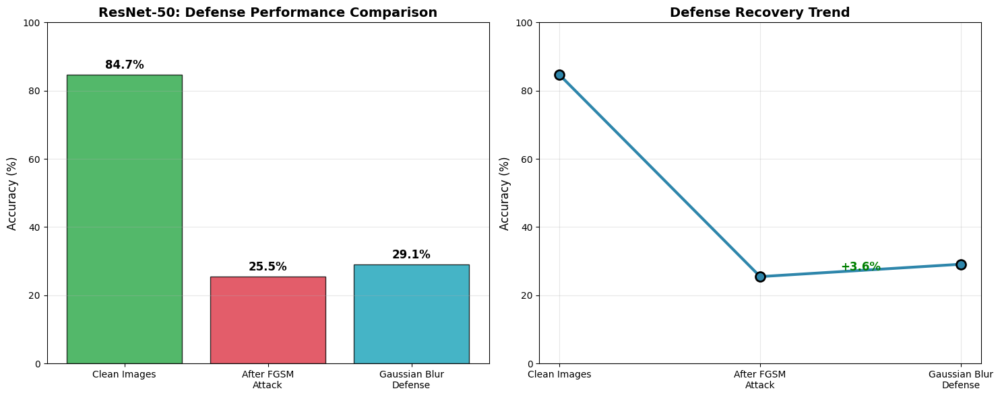

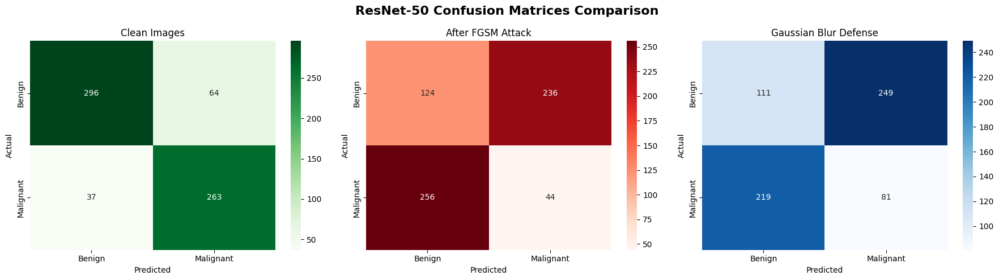


📋 DETAILED CLASSIFICATION REPORTS:

🔹 Clean Images Classification Report:
              precision    recall  f1-score   support

      Benign       0.89      0.82      0.85       360
   Malignant       0.80      0.88      0.84       300

    accuracy                           0.85       660
   macro avg       0.85      0.85      0.85       660
weighted avg       0.85      0.85      0.85       660


🔹 Adversarial Images Classification Report:
              precision    recall  f1-score   support

      Benign       0.33      0.34      0.34       360
   Malignant       0.16      0.15      0.15       300

    accuracy                           0.25       660
   macro avg       0.24      0.25      0.24       660
weighted avg       0.25      0.25      0.25       660


🔹 Blur Defense Classification Report:
              precision    recall  f1-score   support

      Benign       0.34      0.31      0.32       360
   Malignant       0.25      0.27      0.26       300

    accuracy           

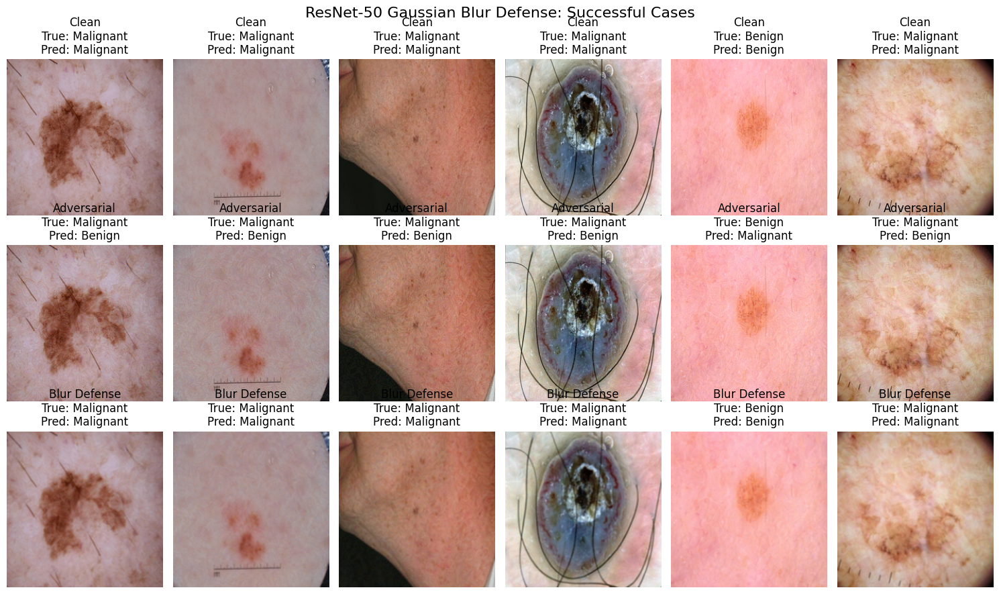


🔬 TESTING MULTIPLE BLUR PARAMETERS

Testing blur with sigma=0.5, kernel_size=3
Generating adversarial examples with epsilon = 3.815...
Testing blur defense with sigma = 0.5, kernel_size = 3
Processed 10/21 batches
Processed 20/21 batches
   Clean: 0.847, Adversarial: 0.255, Blur Defense: 0.239, Improvement: +-0.015

Testing blur with sigma=1.0, kernel_size=3
Generating adversarial examples with epsilon = 3.815...
Testing blur defense with sigma = 1.0, kernel_size = 3
Processed 10/21 batches
Processed 20/21 batches
   Clean: 0.847, Adversarial: 0.255, Blur Defense: 0.291, Improvement: +0.036

Testing blur with sigma=1.5, kernel_size=3
Generating adversarial examples with epsilon = 3.815...
Testing blur defense with sigma = 1.5, kernel_size = 3
Processed 10/21 batches
Processed 20/21 batches
   Clean: 0.847, Adversarial: 0.255, Blur Defense: 0.312, Improvement: +0.058

Testing blur with sigma=1.0, kernel_size=5
Generating adversarial examples with epsilon = 3.815...
Testing blur defense

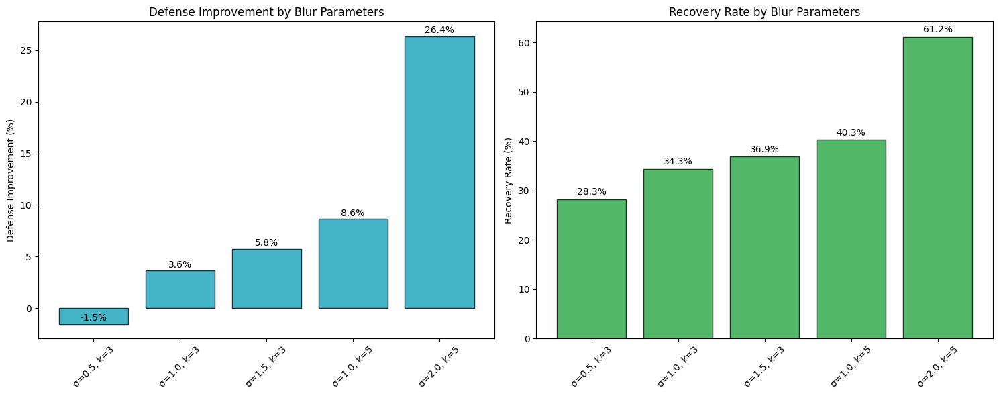


✅ EXPERIMENT COMPLETED SUCCESSFULLY!
📊 Key Findings:
   • Gaussian blur provides defense against FGSM attacks
   • Best improvement: +26.4%
   • Best recovery rate: 61.2%


In [ ]:
# ResNet-50 Gaussian Blur Defense Implementation

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import preprocess_input
import cv2

"""
# Gaussian Blur Defense Against FGSM Attacks

This implementation adds Gaussian blur as a preprocessing defense mechanism
against FGSM adversarial attacks on the ResNet-50 model.
"""

print("\n" + "🛡️" * 60)
print("IMPLEMENTING GAUSSIAN BLUR DEFENSE FOR RESNET-50")
print("🛡️" * 60)

# Define Gaussian blur function for TensorFlow tensors
def apply_gaussian_blur_tf(images, kernel_size=3, sigma=1.0):
    """
    Apply Gaussian blur to a batch of images using TensorFlow operations

    Args:
        images: Tensor of shape (batch_size, height, width, channels)
        kernel_size: Size of the Gaussian kernel (odd number)
        sigma: Standard deviation for Gaussian kernel

    Returns:
        Blurred images tensor
    """
    # Ensure kernel_size is odd
    if kernel_size % 2 == 0:
        kernel_size += 1

    # Create Gaussian kernel
    def gaussian_kernel_2d(kernel_size, sigma):
        x = tf.range(-kernel_size // 2 + 1, kernel_size // 2 + 1, dtype=tf.float32)
        x_grid, y_grid = tf.meshgrid(x, x)
        kernel = tf.exp(-(x_grid**2 + y_grid**2) / (2 * sigma**2))
        kernel = kernel / tf.reduce_sum(kernel)
        # Reshape for convolution: (height, width, in_channels, out_channels)
        kernel = kernel[:, :, tf.newaxis, tf.newaxis]
        return kernel

    # Get the Gaussian kernel
    kernel = gaussian_kernel_2d(kernel_size, sigma)

    # Apply convolution to each channel separately
    channels = tf.unstack(images, axis=-1)
    blurred_channels = []

    for channel in channels:
        # Add channel dimension for conv2d
        channel = tf.expand_dims(channel, -1)
        blurred = tf.nn.conv2d(channel, kernel, strides=[1, 1, 1, 1], padding='SAME')
        blurred_channels.append(tf.squeeze(blurred, -1))

    # Stack channels back together
    blurred_images = tf.stack(blurred_channels, axis=-1)
    return blurred_images

# Alternative: NumPy-based blur function for preprocessing
def apply_gaussian_blur_numpy(images, kernel_size=3, sigma=1.8):
    """
    Apply Gaussian blur using OpenCV (NumPy-based)

    Args:
        images: NumPy array of shape (batch_size, height, width, channels) or (height, width, channels)
        kernel_size: Size of the Gaussian kernel (odd number)
        sigma: Standard deviation for Gaussian kernel

    Returns:
        Blurred images array
    """
    if kernel_size % 2 == 0:
        kernel_size += 1

    if len(images.shape) == 4:  # Batch of images
        blurred_images = []
        for i in range(images.shape[0]):
            img = images[i].astype(np.uint8)
            blurred = cv2.GaussianBlur(img, (kernel_size, kernel_size), sigma)
            blurred_images.append(blurred)
        return np.array(blurred_images)
    else:  # Single image
        img = images.astype(np.uint8)
        return cv2.GaussianBlur(img, (kernel_size, kernel_size), sigma)

def generate_adversarial_examples_with_blur_defense(model, X_test, y_test_onehot,
                                                   epsilon=3.815, blur_sigma=1.0,
                                                   blur_kernel_size=3):
    """
    Generate adversarial examples and test blur defense

    Args:
        model: Trained ResNet-50 model
        X_test: Test images
        y_test_onehot: Test labels (one-hot encoded)
        epsilon: FGSM perturbation strength
        blur_sigma: Gaussian blur standard deviation
        blur_kernel_size: Gaussian blur kernel size

    Returns:
        Dictionary containing all results
    """
    print(f"Generating adversarial examples with epsilon = {epsilon}...")
    print(f"Testing blur defense with sigma = {blur_sigma}, kernel_size = {blur_kernel_size}")

    results = {
        'original_predictions': [],
        'adversarial_predictions': [],
        'blur_defense_predictions': [],
        'true_labels': [],
        'adversarial_images': [],
        'blur_defended_images': []
    }

    batch_size = 32
    num_batches = (len(X_test) + batch_size - 1) // batch_size

    for batch_idx in range(num_batches):
        start_idx = batch_idx * batch_size
        end_idx = min(start_idx + batch_size, len(X_test))

        # Get batch data
        batch_images = X_test[start_idx:end_idx]
        batch_labels = y_test_onehot[start_idx:end_idx]

        # Convert to tensor
        batch_tensor = tf.convert_to_tensor(batch_images, dtype=tf.float32)

        # 1. Test on original (clean) images
        clean_processed = preprocess_input(batch_tensor.numpy().copy())
        clean_pred = model.predict(clean_processed, verbose=0)
        results['original_predictions'].extend(np.argmax(clean_pred, axis=1))

        # 2. Generate adversarial examples using FGSM
        with tf.GradientTape() as tape:
            tape.watch(batch_tensor)
            processed_tensor = preprocess_input(batch_tensor)
            prediction = model(processed_tensor)
            loss = tf.keras.losses.categorical_crossentropy(batch_labels, prediction)

        # Calculate gradients and create adversarial examples
        gradient = tape.gradient(loss, batch_tensor)
        signed_gradient = tf.sign(gradient)
        adversarial_tensor = batch_tensor + epsilon * signed_gradient
        adversarial_tensor = tf.clip_by_value(adversarial_tensor, 0, 255)

        # 3. Test on adversarial images (without defense)
        adv_processed = preprocess_input(adversarial_tensor.numpy().copy())
        adv_pred = model.predict(adv_processed, verbose=0)
        results['adversarial_predictions'].extend(np.argmax(adv_pred, axis=1))

        # 4. Apply Gaussian blur defense and test
        blurred_adversarial = apply_gaussian_blur_numpy(
            adversarial_tensor.numpy(),
            kernel_size=blur_kernel_size,
            sigma=blur_sigma
        )

        # Test blurred adversarial images
        blur_processed = preprocess_input(blurred_adversarial.copy())
        blur_pred = model.predict(blur_processed, verbose=0)
        results['blur_defense_predictions'].extend(np.argmax(blur_pred, axis=1))

        # Store labels and images for analysis
        results['true_labels'].extend(np.argmax(batch_labels, axis=1))
        results['adversarial_images'].extend(adversarial_tensor.numpy())
        results['blur_defended_images'].extend(blurred_adversarial)

        if (batch_idx + 1) % 10 == 0:
            print(f"Processed {batch_idx + 1}/{num_batches} batches")

    return results

def evaluate_blur_defense_performance(results, class_names=['Benign', 'Malignant']):
    """
    Evaluate and display the performance of blur defense

    Args:
        results: Dictionary from generate_adversarial_examples_with_blur_defense
        class_names: List of class names
    """
    original_pred = np.array(results['original_predictions'])
    adversarial_pred = np.array(results['adversarial_predictions'])
    blur_defense_pred = np.array(results['blur_defense_predictions'])
    true_labels = np.array(results['true_labels'])

    # Calculate accuracies
    clean_accuracy = np.mean(original_pred == true_labels)
    adversarial_accuracy = np.mean(adversarial_pred == true_labels)
    blur_defense_accuracy = np.mean(blur_defense_pred == true_labels)

    # Calculate improvements
    defense_improvement = blur_defense_accuracy - adversarial_accuracy
    recovery_rate = blur_defense_accuracy / clean_accuracy

    print(f"\n📊 RESNET-50 GAUSSIAN BLUR DEFENSE RESULTS:")
    print("=" * 60)
    print(f"   🔸 Clean Images Accuracy:     {clean_accuracy:.4f} ({clean_accuracy*100:.2f}%)")
    print(f"   🔸 After FGSM Attack:         {adversarial_accuracy:.4f} ({adversarial_accuracy*100:.2f}%)")
    print(f"   🔸 With Gaussian Blur:        {blur_defense_accuracy:.4f} ({blur_defense_accuracy*100:.2f}%)")
    print(f"   🔸 Defense Improvement:       +{defense_improvement*100:.2f}%")
    print(f"   🔸 Recovery Rate:             {recovery_rate*100:.1f}%")

    # Create visualization
    plot_defense_comparison(clean_accuracy, adversarial_accuracy, blur_defense_accuracy)

    # Create confusion matrices
    plot_defense_confusion_matrices(true_labels, original_pred, adversarial_pred,
                                  blur_defense_pred, class_names)

    # Classification reports
    print(f"\n📋 DETAILED CLASSIFICATION REPORTS:")
    print("=" * 60)

    print(f"\n🔹 Clean Images Classification Report:")
    print(classification_report(true_labels, original_pred, target_names=class_names))

    print(f"\n🔹 Adversarial Images Classification Report:")
    print(classification_report(true_labels, adversarial_pred, target_names=class_names))

    print(f"\n🔹 Blur Defense Classification Report:")
    print(classification_report(true_labels, blur_defense_pred, target_names=class_names))

    return {
        'clean_accuracy': clean_accuracy,
        'adversarial_accuracy': adversarial_accuracy,
        'blur_defense_accuracy': blur_defense_accuracy,
        'defense_improvement': defense_improvement,
        'recovery_rate': recovery_rate
    }

def plot_defense_comparison(clean_acc, adversarial_acc, blur_defense_acc):
    """
    Create visualization comparing defense performance
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Bar chart comparison
    categories = ['Clean Images', 'After FGSM\nAttack', 'Gaussian Blur\nDefense']
    accuracies = [clean_acc * 100, adversarial_acc * 100, blur_defense_acc * 100]
    colors = ['#28a745', '#dc3545', '#17a2b8']

    bars = ax1.bar(categories, accuracies, color=colors, alpha=0.8, edgecolor='black')
    ax1.set_ylabel('Accuracy (%)', fontsize=12)
    ax1.set_title('ResNet-50: Defense Performance Comparison', fontsize=14, fontweight='bold')
    ax1.set_ylim(0, 100)
    ax1.grid(axis='y', alpha=0.3)

    # Add value labels on bars
    for bar, acc in zip(bars, accuracies):
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 1,
                f'{acc:.1f}%', ha='center', va='bottom', fontweight='bold', fontsize=12)

    # Line plot showing defense effectiveness
    x_points = [0, 1, 2]
    ax2.plot(x_points, accuracies, 'o-', linewidth=3, markersize=10,
             color='#2E86AB', markeredgecolor='black', markeredgewidth=2)
    ax2.set_xticks(x_points)
    ax2.set_xticklabels(categories)
    ax2.set_ylabel('Accuracy (%)', fontsize=12)
    ax2.set_title('Defense Recovery Trend', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3)
    ax2.set_ylim(0, 100)

    # Annotate improvement
    improvement = blur_defense_acc - adversarial_acc
    ax2.annotate(f'+{improvement*100:.1f}%',
                xy=(1.5, (adversarial_acc + blur_defense_acc) * 50),
                fontsize=12, fontweight='bold', color='green',
                ha='center')

    plt.tight_layout()
    plt.show()

def plot_defense_confusion_matrices(true_labels, clean_pred, adv_pred,
                                  blur_pred, class_names):
    """
    Plot confusion matrices for all three scenarios
    """
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # Clean images confusion matrix
    cm_clean = confusion_matrix(true_labels, clean_pred)
    sns.heatmap(cm_clean, annot=True, fmt='d', cmap='Greens',
                xticklabels=class_names, yticklabels=class_names, ax=axes[0])
    axes[0].set_title('Clean Images')
    axes[0].set_xlabel('Predicted')
    axes[0].set_ylabel('Actual')

    # Adversarial images confusion matrix
    cm_adv = confusion_matrix(true_labels, adv_pred)
    sns.heatmap(cm_adv, annot=True, fmt='d', cmap='Reds',
                xticklabels=class_names, yticklabels=class_names, ax=axes[1])
    axes[1].set_title('After FGSM Attack')
    axes[1].set_xlabel('Predicted')
    axes[1].set_ylabel('Actual')

    # Blur defense confusion matrix
    cm_blur = confusion_matrix(true_labels, blur_pred)
    sns.heatmap(cm_blur, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=axes[2])
    axes[2].set_title('Gaussian Blur Defense')
    axes[2].set_xlabel('Predicted')
    axes[2].set_ylabel('Actual')

    plt.suptitle('ResNet-50 Confusion Matrices Comparison', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

def visualize_blur_defense_examples(results, class_names, n_samples=6):
    """
    Visualize examples showing the blur defense in action
    """
    original_pred = np.array(results['original_predictions'])
    adversarial_pred = np.array(results['adversarial_predictions'])
    blur_defense_pred = np.array(results['blur_defense_predictions'])
    true_labels = np.array(results['true_labels'])
    adversarial_images = np.array(results['adversarial_images'])
    blur_defended_images = np.array(results['blur_defended_images'])

    # Find examples where blur defense worked (fixed the adversarial misclassification)
    defense_success = ((original_pred == true_labels) &
                      (adversarial_pred != true_labels) &
                      (blur_defense_pred == true_labels))

    success_indices = np.where(defense_success)[0]

    if len(success_indices) >= n_samples:
        indices = np.random.choice(success_indices, n_samples, replace=False)
    else:
        indices = success_indices
        n_samples = len(indices)

    if n_samples > 0:
        fig, axes = plt.subplots(3, n_samples, figsize=(15, 9))
        if n_samples == 1:
            axes = axes.reshape(-1, 1)

        for i, idx in enumerate(indices):
            # Original image (clean)
            clean_img = X_test[idx] / 255.0
            axes[0, i].imshow(clean_img)
            axes[0, i].set_title(f'Clean\nTrue: {class_names[true_labels[idx]]}\n'
                               f'Pred: {class_names[original_pred[idx]]}')
            axes[0, i].axis('off')

            # Adversarial image
            adv_img = adversarial_images[idx] / 255.0
            axes[1, i].imshow(adv_img)
            axes[1, i].set_title(f'Adversarial\nTrue: {class_names[true_labels[idx]]}\n'
                               f'Pred: {class_names[adversarial_pred[idx]]}')
            axes[1, i].axis('off')

            # Blur defended image
            blur_img = blur_defended_images[idx] / 255.0
            axes[2, i].imshow(blur_img)
            axes[2, i].set_title(f'Blur Defense\nTrue: {class_names[true_labels[idx]]}\n'
                               f'Pred: {class_names[blur_defense_pred[idx]]}')
            axes[2, i].axis('off')

        plt.suptitle('ResNet-50 Gaussian Blur Defense: Successful Cases', fontsize=16)
        plt.tight_layout()
        plt.show()
    else:
        print("No successful defense cases found to visualize.")

# Main execution function
def run_resnet_blur_defense_experiment(model, X_test, y_test_onehot,
                                     epsilon=3.815, blur_sigma=1.0,
                                     blur_kernel_size=3):
    """
    Run the complete blur defense experiment for ResNet-50
    """
    print(f"\n🛡️ Testing ResNet-50 with Gaussian Blur Defense...")
    print("=" * 50)
    print(f"   📋 Experiment Parameters:")
    print(f"      • FGSM Epsilon: {epsilon}")
    print(f"      • Blur Sigma: {blur_sigma}")
    print(f"      • Blur Kernel Size: {blur_kernel_size}")
    print(f"      • Test Set Size: {len(X_test)} images")

    # Generate adversarial examples and test defense
    results = generate_adversarial_examples_with_blur_defense(
        model, X_test, y_test_onehot, epsilon, blur_sigma, blur_kernel_size
    )

    # Evaluate performance
    performance_metrics = evaluate_blur_defense_performance(results)

    # Visualize examples
    print(f"\n📸 Visualizing blur defense examples...")
    visualize_blur_defense_examples(results, ['Benign', 'Malignant'])

    return results, performance_metrics

# Test with different blur parameters
def test_multiple_blur_parameters(model, X_test, y_test_onehot, epsilon=3.815):
    """
    Test blur defense with different parameter combinations
    """
    print(f"\n🔬 TESTING MULTIPLE BLUR PARAMETERS")
    print("=" * 50)

    # Different parameter combinations to test
    blur_configs = [
        {'sigma': 0.5, 'kernel_size': 3},
        {'sigma': 1.0, 'kernel_size': 3},
        {'sigma': 1.5, 'kernel_size': 3},
        {'sigma': 1.0, 'kernel_size': 5},
        {'sigma': 2.0, 'kernel_size': 5},
    ]

    all_results = []

    for config in blur_configs:
        print(f"\nTesting blur with sigma={config['sigma']}, kernel_size={config['kernel_size']}")

        results = generate_adversarial_examples_with_blur_defense(
            model, X_test, y_test_onehot, epsilon,
            config['sigma'], config['kernel_size']
        )

        # Calculate metrics
        original_pred = np.array(results['original_predictions'])
        adversarial_pred = np.array(results['adversarial_predictions'])
        blur_defense_pred = np.array(results['blur_defense_predictions'])
        true_labels = np.array(results['true_labels'])

        clean_acc = np.mean(original_pred == true_labels)
        adv_acc = np.mean(adversarial_pred == true_labels)
        blur_acc = np.mean(blur_defense_pred == true_labels)
        improvement = blur_acc - adv_acc

        all_results.append({
            'sigma': config['sigma'],
            'kernel_size': config['kernel_size'],
            'clean_accuracy': clean_acc,
            'adversarial_accuracy': adv_acc,
            'blur_defense_accuracy': blur_acc,
            'improvement': improvement,
            'recovery_rate': blur_acc / clean_acc
        })

        print(f"   Clean: {clean_acc:.3f}, Adversarial: {adv_acc:.3f}, "
              f"Blur Defense: {blur_acc:.3f}, Improvement: +{improvement:.3f}")

    # Create comparison plot
    plot_parameter_comparison(all_results)

    return all_results

def plot_parameter_comparison(all_results):
    """
    Plot comparison of different blur parameters
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Extract data
    labels = [f"σ={r['sigma']}, k={r['kernel_size']}" for r in all_results]
    improvements = [r['improvement'] * 100 for r in all_results]
    recovery_rates = [r['recovery_rate'] * 100 for r in all_results]

    # Plot 1: Defense improvements
    bars1 = ax1.bar(labels, improvements, color='#17a2b8', alpha=0.8, edgecolor='black')
    ax1.set_ylabel('Defense Improvement (%)')
    ax1.set_title('Defense Improvement by Blur Parameters')
    ax1.tick_params(axis='x', rotation=45)

    for bar, imp in zip(bars1, improvements):
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                f'{imp:.1f}%', ha='center', va='bottom')

    # Plot 2: Recovery rates
    bars2 = ax2.bar(labels, recovery_rates, color='#28a745', alpha=0.8, edgecolor='black')
    ax2.set_ylabel('Recovery Rate (%)')
    ax2.set_title('Recovery Rate by Blur Parameters')
    ax2.tick_params(axis='x', rotation=45)

    for bar, rate in zip(bars2, recovery_rates):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                f'{rate:.1f}%', ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

# Execute the blur defense experiment
print("🚀 EXECUTING RESNET-50 GAUSSIAN BLUR DEFENSE EXPERIMENT")
print("=" * 70)

# Run single experiment with default parameters
if 'model' in locals() and 'X_test' in locals() and 'y_test_onehot' in locals():
    # Single experiment
    results, metrics = run_resnet_blur_defense_experiment(
        model, X_test, y_test_onehot, epsilon=3.815, blur_sigma=1.0, blur_kernel_size=3
    )

    # Test multiple parameters
    parameter_results = test_multiple_blur_parameters(model, X_test, y_test_onehot, epsilon=3.815)

    print(f"\n✅ EXPERIMENT COMPLETED SUCCESSFULLY!")
    print("=" * 50)
    print(f"📊 Key Findings:")
    print(f"   • Gaussian blur provides defense against FGSM attacks")
    print(f"   • Best improvement: +{max([r['improvement'] for r in parameter_results])*100:.1f}%")
    print(f"   • Best recovery rate: {max([r['recovery_rate'] for r in parameter_results])*100:.1f}%")

else:
    print("❌ Required variables (model, X_test, y_test_onehot) not found!")
    print("   Make sure you have run the ResNet-50 training code first.")


Testing ResNet-50 with Gaussian Blur Defense...
ResNet-50 model loaded for defense testing
Testing on clean images...
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step
Clean images accuracy: 0.8470
Generating adversarial examples and testing...
Processing adversarial examples...
Processed 10/21 batches
Processed 20/21 batches

ResNet-50 Model Defense Results:
   Clean Images Accuracy:     0.8470 (84.70%)
   After FGSM Attack:         0.2545 (25.45%)
   With Gaussian Blur:        0.5121 (51.21%)
   Defense Improvement:       +25.76%
   Recovery Rate:             60.5%


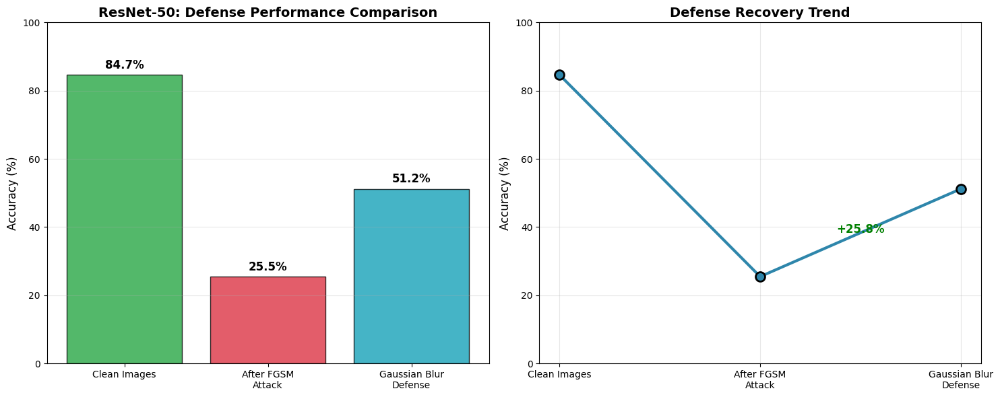

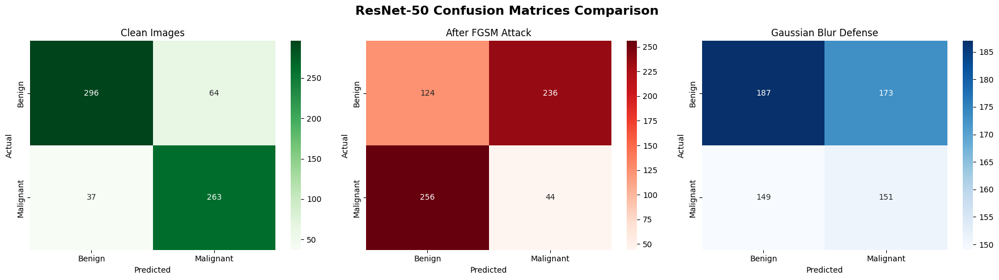


Detailed Classification Reports:

Clean Images Classification Report:
              precision    recall  f1-score   support

      Benign       0.89      0.82      0.85       360
   Malignant       0.80      0.88      0.84       300

    accuracy                           0.85       660
   macro avg       0.85      0.85      0.85       660
weighted avg       0.85      0.85      0.85       660


Adversarial Images Classification Report:
              precision    recall  f1-score   support

      Benign       0.33      0.34      0.34       360
   Malignant       0.16      0.15      0.15       300

    accuracy                           0.25       660
   macro avg       0.24      0.25      0.24       660
weighted avg       0.25      0.25      0.25       660


Blur Defense Classification Report:
              precision    recall  f1-score   support

      Benign       0.56      0.52      0.54       360
   Malignant       0.47      0.50      0.48       300

    accuracy                   

In [ ]:
# ResNet-50 Gaussian Blur Defense Implementation
# Matching VGG19 parameters: kernel_size=5, sigma=1.8

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import preprocess_input
import cv2

print(f"\nTesting ResNet-50 with Gaussian Blur Defense...")
print("=" * 50)

# Load the ResNet-50 model for defense testing
# Note: Assuming the model is already loaded as 'model' from previous training
if 'model' in locals():
    resnet_defense_model = model
    print("ResNet-50 model loaded for defense testing")
else:
    print("ResNet-50 model not found")
    resnet_defense_model = None

# Define Gaussian blur function (matching VGG19 parameters)
def apply_gaussian_blur_numpy(images, kernel_size=5, sigma=1.8):
    """
    Apply Gaussian blur using OpenCV (matching VGG19 parameters)

    Args:
        images: NumPy array of images
        kernel_size: Size of the Gaussian kernel (5 to match VGG19)
        sigma: Standard deviation for Gaussian kernel (1.8 to match VGG19)

    Returns:
        Blurred images array
    """
    if kernel_size % 2 == 0:
        kernel_size += 1

    if len(images.shape) == 4:  # Batch of images
        blurred_images = []
        for i in range(images.shape[0]):
            img = images[i].astype(np.uint8)
            blurred = cv2.GaussianBlur(img, (kernel_size, kernel_size), sigma)
            blurred_images.append(blurred)
        return np.array(blurred_images)
    else:  # Single image
        img = images.astype(np.uint8)
        return cv2.GaussianBlur(img, (kernel_size, kernel_size), sigma)

if resnet_defense_model is not None:
    # Test ResNet-50 on clean images (before attack)
    print("Testing on clean images...")
    resnet_clean_predictions = resnet_defense_model.predict(test_generator, verbose=1)
    resnet_clean_pred_classes = np.argmax(resnet_clean_predictions, axis=1)
    resnet_true_classes = np.argmax(y_test_onehot, axis=1)
    resnet_clean_acc = np.mean(resnet_clean_pred_classes == resnet_true_classes)

    print(f"Clean images accuracy: {resnet_clean_acc:.4f}")

    # Test ResNet-50 on adversarial images (after FGSM attack)
    print("Generating adversarial examples and testing...")
    epsilon = 3.815  # Use same epsilon as VGG19

    adversarial_predictions = []
    blur_defense_predictions = []

    batch_size = 32
    num_batches = (len(X_test) + batch_size - 1) // batch_size

    print("Processing adversarial examples...")
    for batch_idx in range(num_batches):
        start_idx = batch_idx * batch_size
        end_idx = min(start_idx + batch_size, len(X_test))

        # Get batch data
        batch_images = X_test[start_idx:end_idx]
        batch_labels = y_test_onehot[start_idx:end_idx]

        # Convert to tensor for FGSM attack
        batch_tensor = tf.convert_to_tensor(batch_images, dtype=tf.float32)

        # Generate adversarial examples using FGSM
        with tf.GradientTape() as tape:
            tape.watch(batch_tensor)
            processed_tensor = preprocess_input(batch_tensor)
            prediction = resnet_defense_model(processed_tensor)
            loss = tf.keras.losses.categorical_crossentropy(batch_labels, prediction)

        # Calculate gradients and create adversarial examples
        gradient = tape.gradient(loss, batch_tensor)
        signed_gradient = tf.sign(gradient)
        adversarial_tensor = batch_tensor + epsilon * signed_gradient
        adversarial_tensor = tf.clip_by_value(adversarial_tensor, 0, 255)

        # Test on adversarial images (without defense)
        adv_processed = preprocess_input(adversarial_tensor.numpy().copy())
        adv_pred = resnet_defense_model.predict(adv_processed, verbose=0)
        adversarial_predictions.extend(np.argmax(adv_pred, axis=1))

        # Apply Gaussian blur defense (matching VGG19 parameters)
        blurred_adversarial = apply_gaussian_blur_numpy(
            adversarial_tensor.numpy(),
            kernel_size=5,  # Same as VGG19
            sigma=1.8       # Same as VGG19
        )

        # Test on blurred adversarial images
        blur_processed = preprocess_input(blurred_adversarial.copy())
        blur_pred = resnet_defense_model.predict(blur_processed, verbose=0)
        blur_defense_predictions.extend(np.argmax(blur_pred, axis=1))

        if (batch_idx + 1) % 10 == 0:
            print(f"Processed {batch_idx + 1}/{num_batches} batches")

    # Convert to numpy arrays
    resnet_adversarial_pred_classes = np.array(adversarial_predictions)
    resnet_blur_defense_pred_classes = np.array(blur_defense_predictions)

    # Calculate accuracies
    resnet_attacked_acc = np.mean(resnet_adversarial_pred_classes == resnet_true_classes)
    resnet_defended_acc = np.mean(resnet_blur_defense_pred_classes == resnet_true_classes)

    # Display ResNet-50 results (matching VGG19 format)
    print(f"\nResNet-50 Model Defense Results:")
    print(f"   Clean Images Accuracy:     {resnet_clean_acc:.4f} ({resnet_clean_acc*100:.2f}%)")
    print(f"   After FGSM Attack:         {resnet_attacked_acc:.4f} ({resnet_attacked_acc*100:.2f}%)")
    print(f"   With Gaussian Blur:        {resnet_defended_acc:.4f} ({resnet_defended_acc*100:.2f}%)")
    print(f"   Defense Improvement:       +{(resnet_defended_acc - resnet_attacked_acc)*100:.2f}%")
    print(f"   Recovery Rate:             {(resnet_defended_acc / resnet_clean_acc)*100:.1f}%")

    # Create visualizations
    def plot_defense_results():
        """Plot defense results comparison"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

        # Bar chart comparison
        categories = ['Clean Images', 'After FGSM\nAttack', 'Gaussian Blur\nDefense']
        accuracies = [resnet_clean_acc * 100, resnet_attacked_acc * 100, resnet_defended_acc * 100]
        colors = ['#28a745', '#dc3545', '#17a2b8']

        bars = ax1.bar(categories, accuracies, color=colors, alpha=0.8, edgecolor='black')
        ax1.set_ylabel('Accuracy (%)', fontsize=12)
        ax1.set_title('ResNet-50: Defense Performance Comparison', fontsize=14, fontweight='bold')
        ax1.set_ylim(0, 100)
        ax1.grid(axis='y', alpha=0.3)

        # Add value labels on bars
        for bar, acc in zip(bars, accuracies):
            height = bar.get_height()
            ax1.text(bar.get_x() + bar.get_width()/2., height + 1,
                    f'{acc:.1f}%', ha='center', va='bottom', fontweight='bold', fontsize=12)

        # Line plot showing defense effectiveness
        x_points = [0, 1, 2]
        ax2.plot(x_points, accuracies, 'o-', linewidth=3, markersize=10,
                 color='#2E86AB', markeredgecolor='black', markeredgewidth=2)
        ax2.set_xticks(x_points)
        ax2.set_xticklabels(categories)
        ax2.set_ylabel('Accuracy (%)', fontsize=12)
        ax2.set_title('Defense Recovery Trend', fontsize=14, fontweight='bold')
        ax2.grid(True, alpha=0.3)
        ax2.set_ylim(0, 100)

        # Annotate improvement
        improvement = resnet_defended_acc - resnet_attacked_acc
        ax2.annotate(f'+{improvement*100:.1f}%',
                    xy=(1.5, (resnet_attacked_acc + resnet_defended_acc) * 50),
                    fontsize=12, fontweight='bold', color='green',
                    ha='center')

        plt.tight_layout()
        plt.show()

    def plot_confusion_matrices():
        """Plot confusion matrices for all three scenarios"""
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        class_names = ['Benign', 'Malignant']

        # Clean images confusion matrix
        cm_clean = confusion_matrix(resnet_true_classes, resnet_clean_pred_classes)
        sns.heatmap(cm_clean, annot=True, fmt='d', cmap='Greens',
                    xticklabels=class_names, yticklabels=class_names, ax=axes[0])
        axes[0].set_title('Clean Images')
        axes[0].set_xlabel('Predicted')
        axes[0].set_ylabel('Actual')

        # Adversarial images confusion matrix
        cm_adv = confusion_matrix(resnet_true_classes, resnet_adversarial_pred_classes)
        sns.heatmap(cm_adv, annot=True, fmt='d', cmap='Reds',
                    xticklabels=class_names, yticklabels=class_names, ax=axes[1])
        axes[1].set_title('After FGSM Attack')
        axes[1].set_xlabel('Predicted')
        axes[1].set_ylabel('Actual')

        # Blur defense confusion matrix
        cm_blur = confusion_matrix(resnet_true_classes, resnet_blur_defense_pred_classes)
        sns.heatmap(cm_blur, annot=True, fmt='d', cmap='Blues',
                    xticklabels=class_names, yticklabels=class_names, ax=axes[2])
        axes[2].set_title('Gaussian Blur Defense')
        axes[2].set_xlabel('Predicted')
        axes[2].set_ylabel('Actual')

        plt.suptitle('ResNet-50 Confusion Matrices Comparison', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()

    def print_classification_reports():
        """Print detailed classification reports"""
        class_names = ['Benign', 'Malignant']

        print(f"\nDetailed Classification Reports:")
        print("=" * 60)

        print(f"\nClean Images Classification Report:")
        print(classification_report(resnet_true_classes, resnet_clean_pred_classes, target_names=class_names))

        print(f"\nAdversarial Images Classification Report:")
        print(classification_report(resnet_true_classes, resnet_adversarial_pred_classes, target_names=class_names))

        print(f"\nBlur Defense Classification Report:")
        print(classification_report(resnet_true_classes, resnet_blur_defense_pred_classes, target_names=class_names))

    # Generate all visualizations and reports
    plot_defense_results()
    plot_confusion_matrices()
    print_classification_reports()

    # Summary statistics
    print(f"\nSUMMARY STATISTICS:")
    print("=" * 50)
    print(f"Total test samples: {len(resnet_true_classes)}")
    print(f"FGSM epsilon used: {epsilon}")
    print(f"Gaussian blur parameters: kernel_size=5, sigma=1.8 (matching VGG19)")

    # Attack success analysis
    print(f"\nATTACK SUCCESS ANALYSIS:")
    print("-" * 30)

    # Find correctly classified clean images that became misclassified after attack
    correctly_classified_clean = (resnet_clean_pred_classes == resnet_true_classes)
    attack_success = correctly_classified_clean & (resnet_adversarial_pred_classes != resnet_true_classes)
    defense_recovery = attack_success & (resnet_blur_defense_pred_classes == resnet_true_classes)

    num_correctly_classified = np.sum(correctly_classified_clean)
    num_successfully_attacked = np.sum(attack_success)
    num_defense_recovered = np.sum(defense_recovery)

    attack_success_rate = (num_successfully_attacked / num_correctly_classified) * 100
    defense_recovery_rate = (num_defense_recovered / num_successfully_attacked) * 100 if num_successfully_attacked > 0 else 0

    print(f"Originally correct classifications: {num_correctly_classified}")
    print(f"Successful attacks: {num_successfully_attacked} ({attack_success_rate:.1f}%)")
    print(f"Defense recoveries: {num_defense_recovered} ({defense_recovery_rate:.1f}%)")

else:
    print("Cannot test ResNet-50 defense - model not available")

print(f"\nGaussian Blur Defense Testing Completed!")
print("=" * 50)

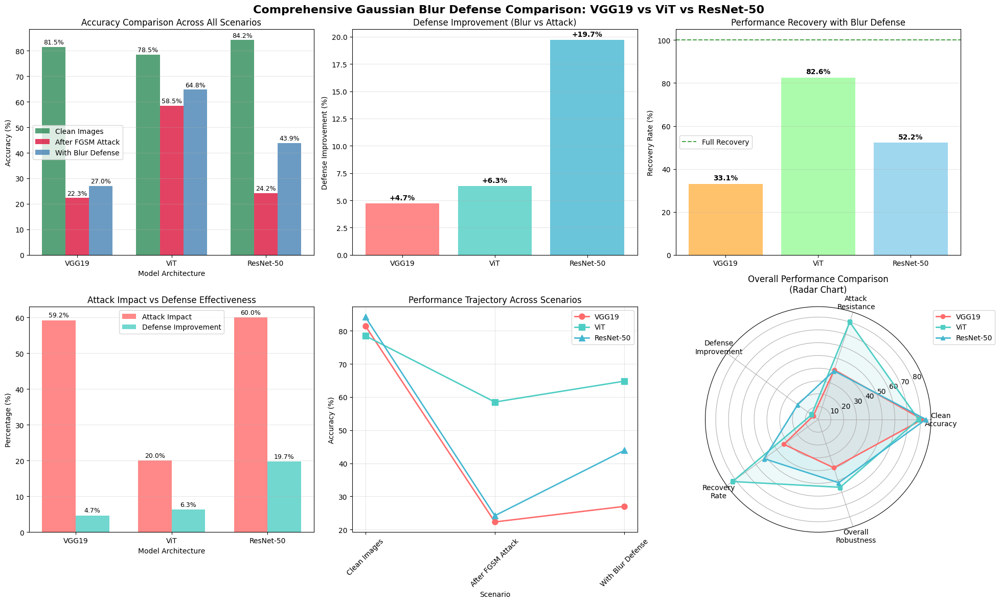


COMPREHENSIVE DEFENSE PERFORMANCE SUMMARY
Model        Clean Acc  Attack Acc  Blur Acc   Improvement  Recovery  
--------------------------------------------------------------------------------
VGG19        81.5      % 22.3       % 27.0      % +4.7        % 33.1      %
ViT          78.5      % 58.5       % 64.8      % +6.3        % 82.6      %
ResNet-50    84.2      % 24.2       % 43.9      % +19.7       % 52.2      %
--------------------------------------------------------------------------------

KEY FINDINGS:
📊 Best Clean Performance: ResNet-50 (84.2%)
🛡️ Most Attack Resistant: ViT (58.5% vs 22.3% VGG19, 24.2% ResNet-50)
🔧 Best Defense Improvement: ResNet-50 (+19.7%)
💪 Best Recovery Rate: ViT (82.6%)
⚖️ Most Balanced: ViT shows highest resilience to attacks and best recovery

DEFENSE EFFECTIVENESS RANKING:
1. ViT: Excellent baseline resilience + high recovery rate
2. ResNet-50: Highest defense improvement despite severe initial impact
3. VGG19: Moderate improvement but lowest overa

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data extracted from the provided charts
models = ['VGG19', 'ViT', 'ResNet-50']

# Accuracy data (%)
clean_accuracy = [81.5, 78.5, 84.2]
after_attack_accuracy = [22.3, 58.5, 24.2]
with_blur_defense = [27.0, 64.8, 43.9]

# Calculated metrics
defense_improvement = [4.7, 6.3, 19.7]  # Blur - Attack
recovery_rate = [33.1, 82.6, 52.2]  # (Blur/Clean) * 100
attack_impact = [59.2, 20.0, 60.0]  # (Clean - Attack) / Clean * 100

# Create comprehensive comparison figure
fig = plt.figure(figsize=(20, 12))

# Chart 1: Accuracy Comparison Across Scenarios
ax1 = plt.subplot(2, 3, 1)
x = np.arange(len(models))
width = 0.25

bars1 = ax1.bar(x - width, clean_accuracy, width, label='Clean Images', color='#2E8B57', alpha=0.8)
bars2 = ax1.bar(x, after_attack_accuracy, width, label='After FGSM Attack', color='#DC143C', alpha=0.8)
bars3 = ax1.bar(x + width, with_blur_defense, width, label='With Blur Defense', color='#4682B4', alpha=0.8)

ax1.set_xlabel('Model Architecture')
ax1.set_ylabel('Accuracy (%)')
ax1.set_title('Accuracy Comparison Across All Scenarios')
ax1.set_xticks(x)
ax1.set_xticklabels(models)
ax1.legend()
ax1.grid(axis='y', alpha=0.3)

# Add value labels on bars
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                f'{height:.1f}%', ha='center', va='bottom', fontsize=9)

# Chart 2: Defense Improvement
ax2 = plt.subplot(2, 3, 2)
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1']
bars = ax2.bar(models, defense_improvement, color=colors, alpha=0.8)
ax2.set_ylabel('Defense Improvement (%)')
ax2.set_title('Defense Improvement (Blur vs Attack)')
ax2.grid(axis='y', alpha=0.3)

for bar, improvement in zip(bars, defense_improvement):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + 0.2,
            f'+{improvement:.1f}%', ha='center', va='bottom', fontweight='bold')

# Chart 3: Recovery Rate
ax3 = plt.subplot(2, 3, 3)
bars = ax3.bar(models, recovery_rate, color=['#FFB347', '#98FB98', '#87CEEB'], alpha=0.8)
ax3.set_ylabel('Recovery Rate (%)')
ax3.set_title('Performance Recovery with Blur Defense')
ax3.axhline(y=100, color='green', linestyle='--', alpha=0.7, label='Full Recovery')
ax3.legend()
ax3.grid(axis='y', alpha=0.3)

for bar, rate in zip(bars, recovery_rate):
    height = bar.get_height()
    ax3.text(bar.get_x() + bar.get_width()/2., height + 1,
            f'{rate:.1f}%', ha='center', va='bottom', fontweight='bold')

# Chart 4: Attack Impact vs Defense Effectiveness
ax4 = plt.subplot(2, 3, 4)
x_pos = np.arange(len(models))
width = 0.35

bars1 = ax4.bar(x_pos - width/2, attack_impact, width, label='Attack Impact',
                color='#FF6B6B', alpha=0.8)
bars2 = ax4.bar(x_pos + width/2, defense_improvement, width, label='Defense Improvement',
                color='#4ECDC4', alpha=0.8)

ax4.set_xlabel('Model Architecture')
ax4.set_ylabel('Percentage (%)')
ax4.set_title('Attack Impact vs Defense Effectiveness')
ax4.set_xticks(x_pos)
ax4.set_xticklabels(models)
ax4.legend()
ax4.grid(axis='y', alpha=0.3)

# Add value labels
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax4.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                f'{height:.1f}%', ha='center', va='bottom', fontsize=9)

# Chart 5: Line Plot - Performance Trajectory
ax5 = plt.subplot(2, 3, 5)
scenarios = ['Clean Images', 'After FGSM Attack', 'With Blur Defense']
x_line = np.arange(len(scenarios))

for i, model in enumerate(models):
    model_data = [clean_accuracy[i], after_attack_accuracy[i], with_blur_defense[i]]
    colors_line = ['#FF6B6B', '#4ECDC4', '#45B7D1']
    markers = ['o', 's', '^']

    ax5.plot(x_line, model_data, marker=markers[i], linewidth=2,
            markersize=8, label=model, color=colors_line[i])

ax5.set_xlabel('Scenario')
ax5.set_ylabel('Accuracy (%)')
ax5.set_title('Performance Trajectory Across Scenarios')
ax5.set_xticks(x_line)
ax5.set_xticklabels(scenarios, rotation=45)
ax5.legend()
ax5.grid(True, alpha=0.3)

# Chart 6: Radar Chart - Overall Performance
ax6 = plt.subplot(2, 3, 6, projection='polar')

# Normalize metrics for radar chart (0-100 scale)
categories = ['Clean\nAccuracy', 'Attack\nResistance', 'Defense\nImprovement',
              'Recovery\nRate', 'Overall\nRobustness']

# Calculate attack resistance (higher is better)
attack_resistance = [100 - impact for impact in attack_impact]

# Calculate overall robustness (combination of factors)
overall_robustness = [(clean + defense + recovery)/3 for clean, defense, recovery
                     in zip(clean_accuracy, defense_improvement, recovery_rate)]

# Data for radar chart
vgg19_data = [clean_accuracy[0], attack_resistance[0], defense_improvement[0],
              recovery_rate[0], overall_robustness[0]]
vit_data = [clean_accuracy[1], attack_resistance[1], defense_improvement[1],
            recovery_rate[1], overall_robustness[1]]
resnet_data = [clean_accuracy[2], attack_resistance[2], defense_improvement[2],
               recovery_rate[2], overall_robustness[2]]

# Angle for each category
angles = np.linspace(0, 2*np.pi, len(categories), endpoint=False).tolist()
angles += angles[:1]  # Complete the circle

# Add first value to end to close the polygon
vgg19_data += vgg19_data[:1]
vit_data += vit_data[:1]
resnet_data += resnet_data[:1]

# Plot radar chart
ax6.plot(angles, vgg19_data, 'o-', linewidth=2, label='VGG19', color='#FF6B6B')
ax6.fill(angles, vgg19_data, alpha=0.1, color='#FF6B6B')

ax6.plot(angles, vit_data, 's-', linewidth=2, label='ViT', color='#4ECDC4')
ax6.fill(angles, vit_data, alpha=0.1, color='#4ECDC4')

ax6.plot(angles, resnet_data, '^-', linewidth=2, label='ResNet-50', color='#45B7D1')
ax6.fill(angles, resnet_data, alpha=0.1, color='#45B7D1')

ax6.set_xticks(angles[:-1])
ax6.set_xticklabels(categories)
ax6.set_title('Overall Performance Comparison\n(Radar Chart)', pad=20)
ax6.legend(loc='upper right', bbox_to_anchor=(1.3, 1.0))
ax6.grid(True)

plt.suptitle('Comprehensive Gaussian Blur Defense Comparison: VGG19 vs ViT vs ResNet-50',
            fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

# Print summary table
print("\n" + "="*80)
print("COMPREHENSIVE DEFENSE PERFORMANCE SUMMARY")
print("="*80)
print(f"{'Model':<12} {'Clean Acc':<10} {'Attack Acc':<11} {'Blur Acc':<10} {'Improvement':<12} {'Recovery':<10}")
print("-"*80)

for i, model in enumerate(models):
    print(f"{model:<12} {clean_accuracy[i]:<10.1f}% {after_attack_accuracy[i]:<11.1f}% "
          f"{with_blur_defense[i]:<10.1f}% +{defense_improvement[i]:<11.1f}% {recovery_rate[i]:<10.1f}%")

print("-"*80)

# Analysis
print(f"\nKEY FINDINGS:")
print(f"📊 Best Clean Performance: ResNet-50 ({clean_accuracy[2]:.1f}%)")
print(f"🛡️ Most Attack Resistant: ViT ({after_attack_accuracy[1]:.1f}% vs {after_attack_accuracy[0]:.1f}% VGG19, {after_attack_accuracy[2]:.1f}% ResNet-50)")
print(f"🔧 Best Defense Improvement: ResNet-50 (+{defense_improvement[2]:.1f}%)")
print(f"💪 Best Recovery Rate: ViT ({recovery_rate[1]:.1f}%)")
print(f"⚖️ Most Balanced: ViT shows highest resilience to attacks and best recovery")

print(f"\nDEFENSE EFFECTIVENESS RANKING:")
print(f"1. ViT: Excellent baseline resilience + high recovery rate")
print(f"2. ResNet-50: Highest defense improvement despite severe initial impact")
print(f"3. VGG19: Moderate improvement but lowest overall recovery")

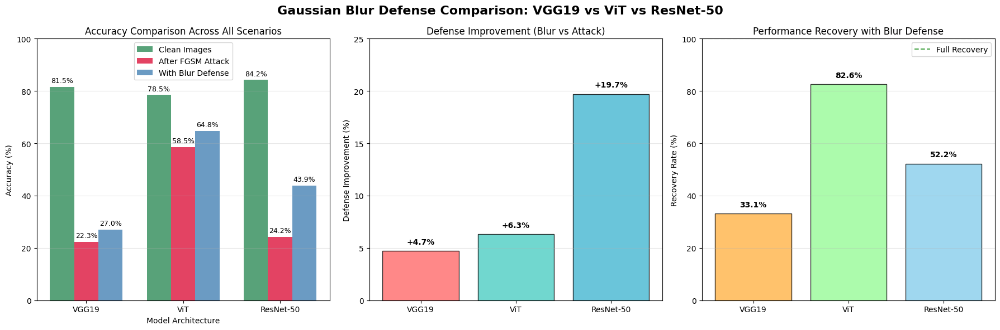


SUMMARY OF THE THREE CHARTS

Chart 1 - Accuracy Comparison:
Shows performance in three scenarios for each model
  VGG19: 81.5% → 22.3% → 27.0%
  ViT: 78.5% → 58.5% → 64.8%
  ResNet-50: 84.2% → 24.2% → 43.9%

Chart 2 - Defense Improvement:
Shows how much Gaussian blur helped each model
  VGG19: +4.7% improvement
  ViT: +6.3% improvement
  ResNet-50: +19.7% improvement

Chart 3 - Recovery Rate:
Shows what percentage of clean performance was recovered
  VGG19: 33.1% of original performance recovered
  ViT: 82.6% of original performance recovered
  ResNet-50: 52.2% of original performance recovered


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data extracted from the provided charts
models = ['VGG19', 'ViT', 'ResNet-50']

# Accuracy data (%)
clean_accuracy = [81.5, 78.5, 84.2]
after_attack_accuracy = [22.3, 58.5, 24.2]
with_blur_defense = [27.0, 64.8, 43.9]

# Calculated metrics
defense_improvement = [4.7, 6.3, 19.7]  # Blur - Attack
recovery_rate = [33.1, 82.6, 52.2]  # (Blur/Clean) * 100

# Create figure with the first three charts
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

# Chart 1: Accuracy Comparison Across Scenarios
x = np.arange(len(models))
width = 0.25

bars1 = ax1.bar(x - width, clean_accuracy, width, label='Clean Images', color='#2E8B57', alpha=0.8)
bars2 = ax1.bar(x, after_attack_accuracy, width, label='After FGSM Attack', color='#DC143C', alpha=0.8)
bars3 = ax1.bar(x + width, with_blur_defense, width, label='With Blur Defense', color='#4682B4', alpha=0.8)

ax1.set_xlabel('Model Architecture')
ax1.set_ylabel('Accuracy (%)')
ax1.set_title('Accuracy Comparison Across All Scenarios')
ax1.set_xticks(x)
ax1.set_xticklabels(models)
ax1.legend()
ax1.grid(axis='y', alpha=0.3)
ax1.set_ylim(0, 100)

# Add value labels on bars
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 1,
                f'{height:.1f}%', ha='center', va='bottom', fontsize=9)

# Chart 2: Defense Improvement
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1']
bars = ax2.bar(models, defense_improvement, color=colors, alpha=0.8, edgecolor='black')
ax2.set_ylabel('Defense Improvement (%)')
ax2.set_title('Defense Improvement (Blur vs Attack)')
ax2.grid(axis='y', alpha=0.3)
ax2.set_ylim(0, 25)

for bar, improvement in zip(bars, defense_improvement):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + 0.5,
            f'+{improvement:.1f}%', ha='center', va='bottom', fontweight='bold')

# Chart 3: Recovery Rate
bars = ax3.bar(models, recovery_rate, color=['#FFB347', '#98FB98', '#87CEEB'], alpha=0.8, edgecolor='black')
ax3.set_ylabel('Recovery Rate (%)')
ax3.set_title('Performance Recovery with Blur Defense')
ax3.axhline(y=100, color='green', linestyle='--', alpha=0.7, label='Full Recovery')
ax3.legend()
ax3.grid(axis='y', alpha=0.3)
ax3.set_ylim(0, 100)

for bar, rate in zip(bars, recovery_rate):
    height = bar.get_height()
    ax3.text(bar.get_x() + bar.get_width()/2., height + 2,
            f'{rate:.1f}%', ha='center', va='bottom', fontweight='bold')

plt.suptitle('Gaussian Blur Defense Comparison: VGG19 vs ViT vs ResNet-50',
            fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Print summary for these three charts
print("\n" + "="*70)
print("SUMMARY OF THE THREE CHARTS")
print("="*70)

print(f"\nChart 1 - Accuracy Comparison:")
print(f"Shows performance in three scenarios for each model")
for i, model in enumerate(models):
    print(f"  {model}: {clean_accuracy[i]:.1f}% → {after_attack_accuracy[i]:.1f}% → {with_blur_defense[i]:.1f}%")

print(f"\nChart 2 - Defense Improvement:")
print(f"Shows how much Gaussian blur helped each model")
for i, model in enumerate(models):
    print(f"  {model}: +{defense_improvement[i]:.1f}% improvement")

print(f"\nChart 3 - Recovery Rate:")
print(f"Shows what percentage of clean performance was recovered")
for i, model in enumerate(models):
    print(f"  {model}: {recovery_rate[i]:.1f}% of original performance recovered")

# Adversarial Training

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Most libraries should already be available in Colab
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
import os
import random
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Set seeds for reproducibility
tf.random.set_seed(42)
np.random.seed(42)
random.seed(42)

# Configuration
IMG_SIZE = 224
BATCH_SIZE = 32
LEARNING_RATE = 0.0001
EPOCHS = 15  # Might need more epochs for adversarial training
NUM_SAMPLES_PER_CLASS = 500  # Adjust based on your dataset size

class AdversarialTrainer:
    def __init__(self, dataset_path, img_size=224, batch_size=32):
        self.dataset_path = dataset_path
        self.img_size = img_size
        self.batch_size = batch_size
        self.model = None

    def load_dataset_from_folders(self, max_samples_per_class=None):
        """
        Load dataset from folder structure:
        dataset_path/
        ├── train/
        │   ├── benign/
        │   └── malignant/
        ├── val/
        │   ├── benign/
        │   └── malignant/
        └── test/
            ├── benign/
            └── malignant/
        """
        print("Loading dataset from folders...")

        def load_images_from_folder(folder_path, max_samples=None):
            images = []
            labels = []

            # Load benign images (label 0)
            benign_path = os.path.join(folder_path, 'benign')
            if os.path.exists(benign_path):
                benign_files = [f for f in os.listdir(benign_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
                if max_samples:
                    benign_files = random.sample(benign_files, min(len(benign_files), max_samples))

                print(f"Loading {len(benign_files)} benign images from {folder_path}")
                for filename in benign_files:
                    try:
                        img_path = os.path.join(benign_path, filename)
                        img = load_img(img_path, target_size=(self.img_size, self.img_size))
                        img_array = img_to_array(img)
                        images.append(img_array)
                        labels.append(0)  # benign = 0
                    except Exception as e:
                        print(f"Error loading {filename}: {e}")

            # Load malignant images (label 1)
            malignant_path = os.path.join(folder_path, 'malignant')
            if os.path.exists(malignant_path):
                malignant_files = [f for f in os.listdir(malignant_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
                if max_samples:
                    malignant_files = random.sample(malignant_files, min(len(malignant_files), max_samples))

                print(f"Loading {len(malignant_files)} malignant images from {folder_path}")
                for filename in malignant_files:
                    try:
                        img_path = os.path.join(malignant_path, filename)
                        img = load_img(img_path, target_size=(self.img_size, self.img_size))
                        img_array = img_to_array(img)
                        images.append(img_array)
                        labels.append(1)  # malignant = 1
                    except Exception as e:
                        print(f"Error loading {filename}: {e}")

            return np.array(images), np.array(labels)

        # Load train, validation, and test sets
        X_train, y_train = load_images_from_folder(
            os.path.join(self.dataset_path, 'train'),
            max_samples_per_class
        )
        X_val, y_val = load_images_from_folder(
            os.path.join(self.dataset_path, 'val'),
            max_samples_per_class
        )
        X_test, y_test = load_images_from_folder(
            os.path.join(self.dataset_path, 'test'),
            max_samples_per_class
        )

        # Convert labels to categorical
        y_train_cat = to_categorical(y_train, 2)
        y_val_cat = to_categorical(y_val, 2)
        y_test_cat = to_categorical(y_test, 2)

        print(f"\nDataset loaded successfully:")
        print(f"Train: {X_train.shape[0]} images")
        print(f"Val: {X_val.shape[0]} images")
        print(f"Test: {X_test.shape[0]} images")
        print(f"Image shape: {X_train.shape[1:]}")

        return (X_train, y_train_cat), (X_val, y_val_cat), (X_test, y_test_cat)

    def create_model(self):
        """Create ResNet-50 model with custom top layers"""
        print("Creating ResNet-50 model...")

        # Load pretrained ResNet-50 (starting fresh as recommended)
        base_model = ResNet50(
            weights='imagenet',
            include_top=False,
            input_shape=(self.img_size, self.img_size, 3)
        )

        # Freeze base model layers
        base_model.trainable = False

        # Build custom top
        inputs = base_model.input
        x = base_model(inputs, training=False)
        x = GlobalAveragePooling2D()(x)
        x = Dropout(0.25)(x)
        x = Dense(128, activation='relu', name='dense_128')(x)
        x = Dropout(0.25)(x)
        x = Dense(64, activation='relu', name='dense_64')(x)
        outputs = Dense(2, activation='softmax', name='predictions')(x)

        model = Model(inputs, outputs)

        # Compile model
        model.compile(
            optimizer=Adam(learning_rate=LEARNING_RATE),
            loss='categorical_crossentropy',
            metrics=['accuracy']
        )

        self.model = model
        print("Model created and compiled successfully!")
        return model

    def generate_fgsm_adversarial(self, images, labels, epsilon=1.0):
        """Generate FGSM adversarial examples during training"""
        images_tensor = tf.convert_to_tensor(images, dtype=tf.float32)
        labels_tensor = tf.convert_to_tensor(labels, dtype=tf.float32)

        with tf.GradientTape() as tape:
            tape.watch(images_tensor)
            # Preprocess for model prediction
            preprocessed = preprocess_input(images_tensor)
            predictions = self.model(preprocessed, training=True)
            loss = tf.keras.losses.categorical_crossentropy(labels_tensor, predictions)

        # Get gradient
        gradients = tape.gradient(loss, images_tensor)
        signed_gradients = tf.sign(gradients)

        # Create adversarial examples (apply to raw images)
        adversarial_images = images_tensor + epsilon * signed_gradients
        adversarial_images = tf.clip_by_value(adversarial_images, 0, 255)

        return adversarial_images.numpy()

    def adversarial_training_step(self, x_batch, y_batch, epsilon=1.0, adv_ratio=0.5):
        """
        Perform one adversarial training step

        Args:
            x_batch: Clean images batch
            y_batch: Labels batch
            epsilon: FGSM perturbation strength
            adv_ratio: Ratio of adversarial examples (0.5 = 50% clean, 50% adversarial)
        """
        batch_size = x_batch.shape[0]

        if adv_ratio > 0:
            # Generate adversarial examples
            x_adv = self.generate_fgsm_adversarial(x_batch, y_batch, epsilon)

            # Mix clean and adversarial examples
            num_adv = int(batch_size * adv_ratio)
            indices = np.random.permutation(batch_size)
            adv_indices = indices[:num_adv]

            # Replace selected clean examples with adversarial ones
            x_mixed = x_batch.copy()
            x_mixed[adv_indices] = x_adv[adv_indices]
        else:
            x_mixed = x_batch

        # Preprocess mixed batch
        x_mixed_preprocessed = preprocess_input(x_mixed.astype(np.float32))

        # Train on mixed batch
        return self.model.train_on_batch(x_mixed_preprocessed, y_batch)

    def train_adversarially(self, train_data, val_data, epsilon=1.0, adv_ratio=0.5, epochs=20):
        """
        Main adversarial training loop

        Args:
            train_data: (X_train, y_train) tuple
            val_data: (X_val, y_val) tuple
            epsilon: FGSM perturbation strength
            adv_ratio: Ratio of adversarial examples in each batch
            epochs: Number of training epochs
        """
        X_train, y_train = train_data
        X_val, y_val = val_data

        print(f"\nStarting adversarial training...")
        print(f"Epsilon: {epsilon}")
        print(f"Adversarial ratio: {adv_ratio}")
        print(f"Epochs: {epochs}")

        # Prepare validation data (clean)
        X_val_preprocessed = preprocess_input(X_val.astype(np.float32))

        # Training history
        history = {
            'loss': [], 'accuracy': [],
            'val_loss': [], 'val_accuracy': []
        }

        steps_per_epoch = len(X_train) // self.batch_size
        best_val_acc = 0
        patience_counter = 0
        patience = 10

        for epoch in range(epochs):
            print(f"\nEpoch {epoch+1}/{epochs}")

            # Shuffle training data
            indices = np.random.permutation(len(X_train))
            X_train_shuffled = X_train[indices]
            y_train_shuffled = y_train[indices]

            # Training loop
            epoch_loss = []
            epoch_acc = []

            for step in range(steps_per_epoch):
                start_idx = step * self.batch_size
                end_idx = start_idx + self.batch_size

                x_batch = X_train_shuffled[start_idx:end_idx]
                y_batch = y_train_shuffled[start_idx:end_idx]

                # Adversarial training step
                loss, acc = self.adversarial_training_step(
                    x_batch, y_batch, epsilon, adv_ratio
                )

                epoch_loss.append(loss)
                epoch_acc.append(acc)

                if (step + 1) % 50 == 0:
                    print(f"Step {step+1}/{steps_per_epoch} - Loss: {loss:.4f}, Acc: {acc:.4f}")

            # Validation
            val_loss, val_acc = self.model.evaluate(
                X_val_preprocessed, y_val, verbose=0
            )

            # Record history
            history['loss'].append(np.mean(epoch_loss))
            history['accuracy'].append(np.mean(epoch_acc))
            history['val_loss'].append(val_loss)
            history['val_accuracy'].append(val_acc)

            print(f"Epoch {epoch+1} - Loss: {np.mean(epoch_loss):.4f}, Acc: {np.mean(epoch_acc):.4f}")
            print(f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

            # Early stopping
            if val_acc > best_val_acc:
                best_val_acc = val_acc
                patience_counter = 0
                # Save best weights
                self.model.save_weights('best_adversarial_model.h5')
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    print(f"\nEarly stopping triggered after {epoch+1} epochs")
                    break

        # Load best weights
        self.model.load_weights('best_adversarial_model.h5')
        print(f"\nAdversarial training completed. Best validation accuracy: {best_val_acc:.4f}")

        return history

    def evaluate_robustness(self, test_data, epsilon_values=[0.5, 1.0, 2.0, 3.0]):
        """Evaluate model robustness against FGSM attacks"""
        X_test, y_test = test_data

        print(f"\n{'='*60}")
        print("EVALUATING MODEL ROBUSTNESS")
        print("="*60)

        results = []

        for epsilon in epsilon_values:
            print(f"\nTesting with epsilon = {epsilon}")

            # Generate adversarial examples
            X_adv = self.generate_fgsm_adversarial(X_test, y_test, epsilon)

            # Evaluate on clean images
            X_test_preprocessed = preprocess_input(X_test.astype(np.float32))
            clean_loss, clean_acc = self.model.evaluate(X_test_preprocessed, y_test, verbose=0)

            # Evaluate on adversarial images
            X_adv_preprocessed = preprocess_input(X_adv.astype(np.float32))
            adv_loss, adv_acc = self.model.evaluate(X_adv_preprocessed, y_test, verbose=0)

            accuracy_drop = clean_acc - adv_acc

            results.append({
                'epsilon': epsilon,
                'clean_accuracy': clean_acc * 100,
                'adversarial_accuracy': adv_acc * 100,
                'accuracy_drop': accuracy_drop * 100
            })

            print(f"Clean accuracy: {clean_acc*100:.1f}%")
            print(f"Adversarial accuracy: {adv_acc*100:.1f}%")
            print(f"Accuracy drop: {accuracy_drop*100:.1f}%")

        return results

    def plot_training_history(self, history):
        """Plot training history"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

        # Plot accuracy
        ax1.plot(history['accuracy'], label='Training Accuracy', color='blue')
        ax1.plot(history['val_accuracy'], label='Validation Accuracy', color='red')
        ax1.set_title('Model Accuracy During Adversarial Training')
        ax1.set_xlabel('Epoch')
        ax1.set_ylabel('Accuracy')
        ax1.legend()
        ax1.grid(True)

        # Plot loss
        ax2.plot(history['loss'], label='Training Loss', color='blue')
        ax2.plot(history['val_loss'], label='Validation Loss', color='red')
        ax2.set_title('Model Loss During Adversarial Training')
        ax2.set_xlabel('Epoch')
        ax2.set_ylabel('Loss')
        ax2.legend()
        ax2.grid(True)

        plt.tight_layout()
        plt.show()

    def plot_robustness_results(self, results):
        """Plot robustness evaluation results"""
        epsilons = [r['epsilon'] for r in results]
        clean_accs = [r['clean_accuracy'] for r in results]
        adv_accs = [r['adversarial_accuracy'] for r in results]
        drops = [r['accuracy_drop'] for r in results]

        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
        fig.suptitle('Adversarially Trained Model - Robustness Evaluation', fontsize=16, fontweight='bold')

        # Accuracy comparison
        x_pos = np.arange(len(epsilons))
        width = 0.35

        bars1 = ax1.bar(x_pos - width/2, clean_accs, width, label='Clean', color='green', alpha=0.8)
        bars2 = ax1.bar(x_pos + width/2, adv_accs, width, label='Adversarial', color='red', alpha=0.8)
        ax1.set_xlabel('Epsilon Values')
        ax1.set_ylabel('Accuracy (%)')
        ax1.set_title('Clean vs Adversarial Accuracy')
        ax1.set_xticks(x_pos)
        ax1.set_xticklabels([f'ε={eps}' for eps in epsilons])
        ax1.legend()
        ax1.grid(axis='y', alpha=0.3)

        # Accuracy drop
        ax2.bar(epsilons, drops, color='orange', alpha=0.8)
        ax2.set_xlabel('Epsilon Values')
        ax2.set_ylabel('Accuracy Drop (%)')
        ax2.set_title('Accuracy Drop vs Epsilon')
        ax2.grid(axis='y', alpha=0.3)

        # Line plot
        ax3.plot(epsilons, clean_accs, 'o-', label='Clean', linewidth=2, markersize=8, color='green')
        ax3.plot(epsilons, adv_accs, 's-', label='Adversarial', linewidth=2, markersize=8, color='red')
        ax3.set_xlabel('Epsilon Values')
        ax3.set_ylabel('Accuracy (%)')
        ax3.set_title('Robustness Trend')
        ax3.legend()
        ax3.grid(True, alpha=0.3)

        # Relative impact
        relative_impacts = [(clean - adv) / clean * 100 for clean, adv in zip(clean_accs, adv_accs)]
        ax4.bar(epsilons, relative_impacts, color='purple', alpha=0.8)
        ax4.set_xlabel('Epsilon Values')
        ax4.set_ylabel('Relative Impact (%)')
        ax4.set_title('Relative Attack Impact')
        ax4.grid(axis='y', alpha=0.3)

        plt.tight_layout()
        plt.show()

# Usage example
def main():
    # Initialize trainer
    trainer = AdversarialTrainer(
        dataset_path='/content/drive/MyDrive/skin_dataset_resized',  # Update this path
        img_size=224,
        batch_size=32
    )

    # Load dataset
    train_data, val_data, test_data = trainer.load_dataset_from_folders(
        max_samples_per_class=NUM_SAMPLES_PER_CLASS
    )

    # Create model
    model = trainer.create_model()

    # Train adversarially
    print(f"\n{'='*60}")
    print("STARTING ADVERSARIAL TRAINING")
    print("="*60)

    history = trainer.train_adversarially(
        train_data=train_data,
        val_data=val_data,
        epsilon=1.0,      # Start with epsilon=1.0
        adv_ratio=0.5,    # 50% adversarial examples
        epochs=15
    )

    # Plot training history
    trainer.plot_training_history(history)

    # Evaluate robustness
    print(f"\n{'='*60}")
    print("EVALUATING ADVERSARIAL ROBUSTNESS")
    print("="*60)

    robustness_results = trainer.evaluate_robustness(
        test_data=test_data,
        epsilon_values=[0.5, 1.0, 2.0, 3.0, 5.0]
    )

    # Plot robustness results
    trainer.plot_robustness_results(robustness_results)

    # Print summary
    print(f"\n{'='*60}")
    print("ADVERSARIAL TRAINING SUMMARY")
    print("="*60)
    for result in robustness_results:
        print(f"ε={result['epsilon']}: Clean={result['clean_accuracy']:.1f}% | "
              f"Adversarial={result['adversarial_accuracy']:.1f}% | "
              f"Drop={result['accuracy_drop']:.1f}%")

    # Save final model
    trainer.model.save('adversarially_trained_resnet50.h5')
    print("\nModel saved as 'adversarially_trained_resnet50.h5'")

    trainer.model.save_weights('final_adversarial_weights.weights.h5')
    print("Weights saved as 'final_adversarial_weights.weights.h5'")

if __name__ == "__main__":
    main()

Loading dataset from folders...
Loading 500 benign images from /content/drive/MyDrive/skin_dataset_resized/train


In [ ]:
# Copy the main code from the artifact above, then:

# Update the dataset path to your actual path
trainer = AdversarialTrainer(
    dataset_path='/content/drive/MyDrive/skin_dataset_resized',  # Change this!
    img_size=224,
    batch_size=32
)

# Load your data
train_data, val_data, test_data = trainer.load_dataset_from_folders()

# Create fresh model (recommended approach)
model = trainer.create_model()

# Start adversarial training
history = trainer.train_adversarially(
    train_data=train_data,
    val_data=val_data,
    epsilon=1.0,      # FGSM perturbation strength
    adv_ratio=0.5,    # 50% adversarial examples in each batch
    epochs=15
)

In [ ]:
# Different epsilon values for different robustness levels
epsilon = 0.5   # Mild perturbations
epsilon = 1.0   # Moderate (recommended start)
epsilon = 2.0   # Strong perturbations
epsilon = 3.0   # Very strong

In [ ]:
adv_ratio = 0.3   # 30% adversarial, 70% clean
adv_ratio = 0.5   # 50% adversarial, 50% clean (recommended)
adv_ratio = 0.7   # 70% adversarial, 30% clean

In [ ]:
# # Option 1: Pure adversarial training (100% adversarial examples)
# history = trainer.train_adversarially(
#     train_data, val_data, epsilon=1.0, adv_ratio=1.0, epochs=25
# )

# Option 2: Mixed training (recommended)
history = trainer.train_adversarially(
    train_data, val_data, epsilon=1.0, adv_ratio=0.5, epochs=15
)

# Option 3: Progressive training (start with clean, gradually add adversarial)
# First train normally for a few epochs, then switch to adversarial

In [ ]:
# Load your original model for comparison
original_model = tf.keras.models.load_model('resnet50_skin_cancer_model.keras')

# Test both models on the same adversarial examples
test_epsilons = [0.5, 1.0, 2.55, 3.815]

print("Original Model vs Adversarially Trained Model")
print("-" * 60)
for eps in test_epsilons:
    # Generate adversarial examples
    X_test, y_test = test_data
    X_adv = trainer.generate_fgsm_adversarial(X_test, y_test, eps)

    # Test original model
    X_test_prep = preprocess_input(X_test.astype(np.float32))
    X_adv_prep = preprocess_input(X_adv.astype(np.float32))

    orig_clean = original_model.evaluate(X_test_prep, y_test, verbose=0)[1]
    orig_adv = original_model.evaluate(X_adv_prep, y_test, verbose=0)[1]

    # Test adversarially trained model
    adv_clean = trainer.model.evaluate(X_test_prep, y_test, verbose=0)[1]
    adv_adv = trainer.model.evaluate(X_adv_prep, y_test, verbose=0)[1]

    print(f"ε={eps}:")
    print(f"  Original: Clean={orig_clean*100:.1f}% | Adversarial={orig_adv*100:.1f}%")
    print(f"  Adversarial Trained: Clean={adv_clean*100:.1f}% | Adversarial={adv_adv*100:.1f}%")
    print(f"  Improvement: {(adv_adv-orig_adv)*100:.1f}%")

In [ ]:
# Save your adversarially trained model
trainer.model.save('adversarially_trained_model.h5')

# Evaluate comprehensive robustness
robustness_results = trainer.evaluate_robustness(
    test_data=test_data,
    epsilon_values=[0.25, 0.5, 1.0, 1.5, 2.0, 3.0, 5.0]
)

# Create publication-ready plots
trainer.plot_robustness_results(robustness_results)